In [2]:
from explore_import import  *
import ionbot_preprocess as io
import data_preprocess as dt
import hpp_checker as hpp
from Download_UnimodDB import *

import itertools 
import time
import re
import ast
from scipy.spatial import distance
from gql import gql, Client
from gql.transport.aiohttp import AIOHTTPTransport
import asyncio
warnings.simplefilter(action='ignore', category=FutureWarning)

In [3]:
figsave_folder="./oui_discovery_gwalk_subfigures/explore-3-hybrid-noncanon-hpp/"

In [5]:
OPfasta_file='./../ionbot_openprot/openprot_2_0_0-human-ensembl106+refseq+uniprot2022_06_01.fasta'
input_file = open(OPfasta_file)
OPfasta = SeqIO.to_dict(SeqIO.parse(OPfasta_file, "fasta"))

In [7]:
OPtsv_file="./../ionbot_openprot/human-openprot-2_0-refprots+altprots+isoforms-uniprot2022_06_01.tsv"
OPtsv=pd.read_csv(OPtsv_file,sep="\t",header=None)
OPtsv.columns=["protein accession","protein accession (others)","protein type","protein length (a.a.)",
               "molecular weight (kDa)","isoelectric point","frame","gene symbol","chr","start genomic coordinates",
               "stop genomic coordinates","strand","transcript accession","type","localization","start transcript coordinates",
               "stop transcript coordinates","MS score","TE Translation Event score","Orthology Across 10 Species #:Species Names",
               "Kozak motif","High-efficiency TIS motif"]#,"Domains"]
#Trimm version number from ENS identifier
OPtsv["trx_stab"]=OPtsv["transcript accession"].str[0:15]

/tmp/ipykernel_1068162/3014122619.py:2: DtypeWarning: Columns (8) have mixed types. Specify dtype option on import or set low_memory=False.
  OPtsv=pd.read_csv(OPtsv_file,sep="\t",header=None)


In [8]:
#https://ftp.ensembl.org/pub/release-106/fasta/homo_sapiens/dna/
ENSfasta_file="./../ionbot_openprot/Homo_sapiens.GRCh38.dna.primary_assembly.fa"
input_file = open(ENSfasta_file)
ENSfasta = SeqIO.to_dict(SeqIO.parse(ENSfasta_file, "fasta"))

In [9]:
all_peptide_sequences=pickle.load(open('./../all_peptide_sequences_OP_7302.pkl', 'rb'))
is_unique=pickle.load(open('./../is_unique_OP_7302.pkl', 'rb'))

In [10]:
with open('combined_first_datasets.pickle', 'rb') as handle:
    combined_first_datasets=pickle.load(handle)

In [11]:
with open('combined_peptides_datasets.pickle', 'rb') as handle:
    combined_peptides_datasets=pickle.load(handle)

In [12]:
def Download_Unimod_Dict_names():
    unimod = Download_UnimodDB()
    condensed_unimod = {}
    for uni_id,df in unimod.groupby("unimod_id").__iter__():
        condensed_unimod[uni_id] = {}
        condensed_unimod[uni_id]['residues'] = "".join([_ for _ in df.residue if '-' not in _])
        condensed_unimod[uni_id]['mono_mass'] = [_ for _ in set(df.mono_mass)][0]
        condensed_unimod[uni_id]['code_name'] = [_ for _ in set(df.code_name)][0]
        condensed_unimod[uni_id]['full_name'] = [_ for _ in set(df.full_name)][0]
        
    return condensed_unimod

In [13]:
unimod = Download_Unimod_Dict_names()
unimod_df=pd.DataFrame.from_dict(unimod, orient='index')
#mark substitutions
unimod_df["isSubstitution"]=unimod_df.full_name.apply(lambda x: "substitution" in x)
unimod_df_subs=unimod_df[unimod_df["isSubstitution"]]

In [49]:
def get_peptide_position_io(s):
    match = re.search(r"\(\((\d+)-(\d+)\)\)", s)    
    return (int(match.group(1)) , int(match.group(2))) if match else None

def filter_nested_intervals(intervals):
    if len(intervals)==1: return True
    # Sort by start ascending, and end descending to prioritize wider intervals
    sorted_intervals = sorted(intervals, key=lambda x: (x[0], -x[1]))
    #print(sorted_intervals)
    result = []

    for i, (start_i, end_i) in enumerate(sorted_intervals):
        is_nested = False
        for j, (start_j, end_j) in enumerate(sorted_intervals):
            if i != j and start_j <= start_i and end_i <= end_j:
                is_nested = True
                break
        if not is_nested:
            result.append((start_i, end_i))
    result_bool=[i in result for i in intervals]
    #print(result_bool)
    return result_bool
    
def filter_short_overlaps(i,overlapping_intervals):
    indexes,intervals = overlapping_intervals
    for indx,interval in zip(indexes,intervals):
        #print(indx,interval)
        if i in indx and len(indx)==1:
            #print(indx)
            return True
        elif i in indx and len(indx)>1:
            #print(indx,interval,abs(interval[0]-interval[1]))
            return abs(interval[0]-interval[1])>=18
        else:
            continue
def check_2_pep(group):
    return len(group)>=2

### Check non-canonical proteins identifications against HPP guidlines

In [50]:
#track how many we loose with each HPP criteria
hpp_countdown={"psm":{},"pep":{},"prot":{}}

In [51]:
comb_datasets=pd.DataFrame()
for dataset_name,subdict in combined_first_datasets.items():
    df=subdict["openprot"]
    df["dataset"]=dataset_name
    comb_datasets=pd.concat([comb_datasets,df])
comb_datasets.reset_index(drop=True,inplace=True)
comb_datasets["peptide_length"]=comb_datasets.database_peptide.apply(lambda x: len(x))
comb_datasets["peptide_position"]=comb_datasets.proteins.apply(lambda x: [get_peptide_position_io(s) for s in x.split("||")])

In [53]:
#leave only unique peptides

comb_datasets_ncun=comb_datasets[comb_datasets.peptide_class=="unique_to_Noncanon"]
len(comb_datasets_ncun.leadprot.unique())

797

In [54]:
#compare with protein level
combined_proteins_ocacam_newop=pd.read_pickle("open_combined_proteins_ocacam_newop.pkl")

In [55]:
len(combined_proteins_ocacam_newop[(combined_proteins_ocacam_newop.isCanonical=="NonCanonical")].proteins.unique())

697

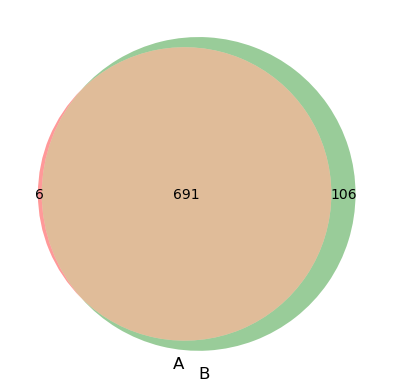

In [56]:
from matplotlib_venn import venn2
 
# First way to call the 2 group Venn diagram:
venn2([set(combined_proteins_ocacam_newop[(combined_proteins_ocacam_newop.isCanonical=="NonCanonical")].proteins.unique()), 
       set(comb_datasets[comb_datasets.peptide_class=="unique_to_Noncanon"].leadprot.unique())])

In [57]:
prot_prot=set(combined_proteins_ocacam_newop[(combined_proteins_ocacam_newop.isCanonical=="NonCanonical")].proteins.unique())
psm_prot= set(comb_datasets[comb_datasets.peptide_class=="unique_to_Noncanon"].leadprot.unique())
psm_prot_diff=psm_prot-prot_prot

In [58]:
#check on peptide level - are some nc's filtered there?
comb_pep_datasets=pd.DataFrame()
for dataset_name,subdict in combined_peptides_datasets.items():
    df=subdict["openprot"]
    df["dataset"]=dataset_name
    comb_pep_datasets=pd.concat([comb_pep_datasets,df])
comb_pep_datasets.reset_index(drop=True,inplace=True)
comb_pep_datasets=comb_pep_datasets[comb_pep_datasets.peptide_class=="unique_to_Noncanon"]
len(comb_pep_datasets.proteins.unique())
comb_pep_datasets["leadprot"]=comb_pep_datasets.proteins.apply(lambda x: io.extract_accession(x,"closed"))

In [59]:
#so proteins picked on psm level did not make it to peptide level even
comb_pep_datasets[comb_pep_datasets.leadprot.isin(psm_prot_diff)]

,database_peptide,peptide_score,q-value,PEP,proteins,spectrum_file,database,psm_score,isModified,is decoy,...,protein_classes,isCanonical,custom_q,isTarget,FDRGroup,glob_cust_hybrid,peptide_class,protein_class,dataset,leadprot


In [60]:
#filter whole psm to match protein level
comb_datasets=comb_datasets[comb_datasets.leadprot.isin(prot_prot)]

In [61]:
#filter proteins that did not make it to protein level

comb_datasets_ncun=comb_datasets_ncun[comb_datasets_ncun.leadprot.isin(prot_prot)]
len(comb_datasets_ncun.leadprot.unique())

691

In [62]:
hpp_countdown["psm"]["original"]=len(comb_datasets_ncun)
hpp_countdown["pep"]["original"]=len(comb_datasets_ncun.drop_duplicates("database_peptide"))
hpp_countdown["prot"]["original"]=len(comb_datasets_ncun.leadprot.unique())

In [63]:
hpp_countdown

{'psm': {'original': 4003},
 'pep': {'original': 944},
 'prot': {'original': 691}}

In [64]:
#Work on peptide level, unfold the list of intervals

comb_datasets_ncun.drop_duplicates("database_peptide",inplace=True)
comb_datasets_ncun["peptide_position"]=comb_datasets_ncun.peptide_position.apply(lambda x: x[0])

In [65]:
len(comb_datasets_ncun.leadprot.unique()),len(comb_datasets_ncun)

(691, 944)

In [66]:
#Filter out peptides <9 aa long

comb_datasets_ncun=comb_datasets_ncun[comb_datasets_ncun.peptide_length>=9]

In [67]:
len(comb_datasets_ncun.leadprot.unique()),len(comb_datasets_ncun)

(657, 900)

In [68]:
hpp_countdown["psm"]["<9aa"]=len(comb_datasets[comb_datasets.database_peptide.isin(comb_datasets_ncun.database_peptide.tolist())])
hpp_countdown["pep"]["<9aa"]=len(comb_datasets_ncun)
hpp_countdown["prot"]["<9aa"]=len(comb_datasets_ncun.leadprot.unique())

In [69]:
hpp_countdown

{'psm': {'original': 4003, '<9aa': 3855},
 'pep': {'original': 944, '<9aa': 900},
 'prot': {'original': 691, '<9aa': 657}}

In [70]:
#Filter out nested peptides

tmp=pd.DataFrame()
for protein, group in comb_datasets_ncun.groupby("leadprot"):
    intervals=group.peptide_position.values
    print(intervals)
    group["NonNested"]=filter_nested_intervals(intervals)    
    tmp=pd.concat([tmp,group])
comb_datasets_ncun=tmp[tmp.NonNested]

[(16, 36)]
[(30, 60)]
[(1, 28)]
[(3, 17)]
[(45, 75)]
[(4, 17)]
[(1, 23)]
[(1, 26)]
[(1, 16)]
[(1, 14)]
[(1, 26)]
[(28, 58) (15, 41)]
[(1, 15)]
[(1, 23)]
[(98, 119)]
[(1, 20)]
[(2, 19)]
[(2, 15)]
[(1, 15)]
[(33, 62)]
[(1, 17)]
[(2, 17)]
[(2, 24) (1, 24) (1, 25) (2, 25)]
[(2, 20)]
[(1, 18)]
[(3, 30)]
[(1, 30) (2, 30)]
[(1, 31)]
[(137, 166)]
[(1, 18)]
[(1, 20)]
[(1, 13)]
[(1, 10)]
[(1, 11)]
[(2, 20)]
[(38, 52) (36, 52)]
[(1, 23)]
[(1, 19)]
[(1, 16)]
[(1, 18) (2, 18)]
[(1, 23)]
[(1, 21)]
[(1, 23)]
[(2, 18)]
[(1, 20)]
[(2, 21)]
[(1, 17) (2, 17)]
[(1, 31)]
[(1, 20)]
[(2, 25)]
[(19, 44)]
[(1, 29)]
[(1, 23)]
[(2, 12)]
[(1, 26)]
[(2, 28) (1, 28)]
[(1, 30)]
[(1, 16)]
[(1, 22)]
[(1, 14)]
[(2, 20)]
[(1, 27)]
[(1, 22)]
[(1, 23)]
[(2, 19)]
[(1, 26)]
[(1, 28)]
[(1, 27)]
[(1, 17)]
[(1, 26)]
[(1, 19) (2, 19)]
[(2, 29)]
[(1, 22) (2, 22)]
[(2, 19)]
[(1, 27)]
[(159, 174)]
[(38, 56)]
[(1, 24)]
[(1, 25) (2, 25)]
[(1, 18)]
[(2, 19)]
[(1, 31)]
[(2, 28) (1, 28)]
[(34, 55)]
[(1, 14)]
[(2, 24)]
[(1, 18)]
[(1, 25

In [72]:
len(comb_datasets_ncun.leadprot.unique()),len(comb_datasets_ncun)

(657, 758)

In [73]:
hpp_countdown["psm"]["nested"]=len(comb_datasets[comb_datasets.database_peptide.isin(comb_datasets_ncun.database_peptide)])
hpp_countdown["pep"]["nested"]=len(comb_datasets_ncun)
hpp_countdown["prot"]["nested"]=len(comb_datasets_ncun.leadprot.unique())

In [74]:
hpp_countdown

{'psm': {'original': 4003, '<9aa': 3855, 'nested': 2696},
 'pep': {'original': 944, '<9aa': 900, 'nested': 758},
 'prot': {'original': 691, '<9aa': 657, 'nested': 657}}

In [75]:
#For overlapping peptides, check the total extent length

tmp=pd.DataFrame()
for protein, group in comb_datasets_ncun.groupby("leadprot"):
    intervals=group.peptide_position.values
    if len(intervals)==1: 
        group["overlap_intervals"]=[True]
    else:
        #print(intervals)
        overlapping_intervals=hpp.find_max_length_in_overlap_groups(intervals)
        #print(overlapping_intervals)
        good_overlap=[filter_short_overlaps(i,overlapping_intervals) for i in range(len(group))]
        group["overlap_intervals"]=good_overlap
        tmp=pd.concat([tmp,group])
comb_datasets_ncun=tmp[tmp.overlap_intervals]

In [76]:
len(comb_datasets_ncun.leadprot.unique()),len(comb_datasets_ncun)

(85, 185)

In [77]:
hpp_countdown["psm"]["<18aa"]=len(comb_datasets[comb_datasets.database_peptide.isin(comb_datasets_ncun.database_peptide)])
hpp_countdown["pep"]["<18aa"]=len(comb_datasets_ncun)
hpp_countdown["prot"]["<18aa"]=len(comb_datasets_ncun.leadprot.unique())

In [78]:
hpp_countdown

{'psm': {'original': 4003, '<9aa': 3855, 'nested': 2696, '<18aa': 879},
 'pep': {'original': 944, '<9aa': 900, 'nested': 758, '<18aa': 185},
 'prot': {'original': 691, '<9aa': 657, 'nested': 657, '<18aa': 85}}

In [354]:
#comb_datasets_ncun.sort_values("leadprot")[["leadprot","database_peptide","peptide_position"]]

In [80]:
#Filter out peptides, that are non-unqiely maped to canonical proteins ProteoMapper

#Input to the list into https://peptideatlas.org/map/
#for pep in comb_datasets_ncun.database_peptide:
#    print(pep)
uniqness_protmap=pd.read_csv("./../ProteoMapper_noncanon_hpp.txt",sep="\t")

uniqness_protmap["isTrypticOrM"]=uniqness_protmap.apply(lambda x: (("M"==x["prevAA"] or "K"==x["prevAA"] or "R"==x["prevAA"])) or "UNMAPPED"==x["protein"],axis=1) #and ("K"==x["nextAA"] or "R"==x["nextAA"])
uniqness_protmap["isUniqueTryptic"]=uniqness_protmap.apply(lambda x: (x["protein"]=="UNMAPPED") or (x["protein"]!="UNMAPPED" and not x["isTrypticOrM"]), axis=1)
uniqness_protmap["isContrib"]=uniqness_protmap.protein.apply(lambda x: x.startswith("CONTRIB"))

#map back uniqness

comb_datasets_ncun["isUniqueTryptic"]=comb_datasets_ncun.database_peptide.apply(lambda x: all(uniqness_protmap.loc[uniqness_protmap.peptide==x,"isUniqueTryptic"]))
comb_datasets_ncun["isContribTryptic"]=comb_datasets_ncun.apply(lambda x: all(uniqness_protmap.loc[uniqness_protmap.peptide==x["database_peptide"],"isContrib"]) and all(uniqness_protmap.loc[uniqness_protmap.peptide==x["database_peptide"],"isTrypticOrM"]), axis=1)

#see which peptides overlap with PeptideAtlass small ORF
print(comb_datasets_ncun[comb_datasets_ncun["isContribTryptic"]][["leadprot","database_peptide"]])
print(uniqness_protmap[uniqness_protmap.peptide.isin(comb_datasets_ncun[comb_datasets_ncun["isContribTryptic"]].database_peptide)])

         leadprot             database_peptide
68679   IP_556624                 LDGLTDEINFLR
306931  IP_556624              DVDEADMNKVELESR
35095   IP_560713     VIHDNFGIVEGLMTIVHAITATQK
39856   IP_560713            IVGSAFCTTNCLAPLAK
216537  IP_560713         LTGMAFCVPTAVSVVDLTCR
35084   IP_592011                AALEATLAETEAR
216567  IP_592011                EVAGHTDQLQMSR
234310  IP_592206             TITLEAEPLDTIENVK
44449   IP_602798  HTGPGILSMANAGPGTNVSQFFICTAK
243754  IP_602798              SIYQEKFDDENFILK
275866  IP_612089                    FAEEDTKLK
6028    IP_624731             ANGETTTQGLDGLSER
6163    IP_636983         IGIVDQSQQAYQEAFEISKK
306852  IP_638654                 QSMESDIHGLRK
16623   IP_672475        IRELQSQISATSVVLSMDNSR
56076   IP_672475           LELESGLEGLTDEINFLR
195832  IP_672475             LETELGNTQGLVEDFK
306896  IP_672475                RTEMENQFVLIKK
16595   IP_691620                    LMLDKLDVK
16500   IP_755256             ISMKEVDEQMLNVQNK
35050   IP_76

/tmp/ipykernel_1068162/1466117229.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  comb_datasets_ncun["isUniqueTryptic"]=comb_datasets_ncun.database_peptide.apply(lambda x: all(uniqness_protmap.loc[uniqness_protmap.peptide==x,"isUniqueTryptic"]))
/tmp/ipykernel_1068162/1466117229.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  comb_datasets_ncun["isContribTryptic"]=comb_datasets_ncun.apply(lambda x: all(uniqness_protmap.loc[uniqness_protmap.peptide==x["database_peptide"],"isContrib"]) and all(uniqn

In [266]:
a=comb_datasets_ncun[comb_datasets_ncun["isContribTryptic"]][["leadprot","database_peptide"]]
b=uniqness_protmap[uniqness_protmap.peptide.isin(comb_datasets_ncun[comb_datasets_ncun["isContribTryptic"]].database_peptide)]
a.columns=["leadprot","peptide"]
c=a.merge(b,on="peptide",how="outer")
print(len(c.leadprot.unique()))
print(c.groupby("leadprot").apply(len).sum())
print(c.drop_duplicates(["leadprot","protein"])[["leadprot","protein"]])

14
22
     leadprot                                protein
0   IP_592011                                    NaN
1   IP_624731                                    NaN
2   IP_774695                                    NaN
3   IP_556624                                    NaN
5   IP_612089                                    NaN
6   IP_602798  CONTRIB_VAL_Cai_98 CONTRIB_VAL_Cai_99
7   IP_636983             CONTRIB_OTTHUMG00000153373
8   IP_672475             CONTRIB_OTTHUMG00000184285
9   IP_755256                                    NaN
10  IP_560713             CONTRIB_OTTHUMG00000024098
11  IP_556624             CONTRIB_OTTHUMG00000024182
14  IP_760574                                    NaN
15  IP_691620                                    NaN
17  IP_638654                                    NaN
20  IP_592206                                    NaN


/tmp/ipykernel_1068162/2628339057.py:6: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



In [276]:
len(comb_datasets_ncun[comb_datasets_ncun.isContribTryptic].leadprot.unique())

14

In [274]:
sel_pep=comb_datasets_ncun[comb_datasets_ncun.isContribTryptic].database_peptide.unique()
uniqness_protmap[(uniqness_protmap.peptide.isin(sel_pep))&(uniqness_protmap.isContrib)]

,peptide,protein,location,prevAA,in_fasta,nextAA,isTrypticOrM,isUniqueTryptic,isContrib
130,HTGPGILSMANAGPGTNVSQFFICTAK,CONTRIB_VAL_Cai_98 CONTRIB_VAL_Cai_99,88,K,HTGPGILSMANAGPGTNVSQFFICTAK,T,True,False,True
140,IGIVDQSQQAYQEAFEISKK,CONTRIB_OTTHUMG00000153373,118,K,IGIVDQSQQAYQEAFEISKK,E,True,False,True
153,IRELQSQISATSVVLSMDNSR,CONTRIB_OTTHUMG00000184285,146,K,IRELQSQISATSVVLSMDNSR,S,True,False,True
160,IVGSAFCTTNCLAPLAK,CONTRIB_OTTHUMG00000024098,17,K,IVGSAFCTTNCLAPLAK,V,True,False,True
215,LDGLTDEINFLR,CONTRIB_OTTHUMG00000024182,213,R,LDGLTDEINFLR,Q,True,False,True
221,LELESGLEGLTDEINFLR,CONTRIB_OTTHUMG00000184285,122,K,LELESGLEGLTDEINFLR,R,True,False,True
223,LETELGNTQGLVEDFK,CONTRIB_OTTHUMG00000184285,75,K,LETELGNTQGLVEDFK,N,True,False,True
247,LTGMAFCVPTAVSVVDLTCR,CONTRIB_OTTHUMG00000024098,99,K,LTGMAFCVPTAVSVVDLTCR,L,True,False,True
390,RTEMENQFVLIKK,CONTRIB_OTTHUMG00000184285,100,K,RTEMENQFVLIKK,D,True,False,True
400,SIYQEKFDDENFILK,CONTRIB_VAL_Cai_98 CONTRIB_VAL_Cai_99,73,K,SIYQEKFDDENFILK,H,True,False,True


In [260]:
((comb_datasets_ncun.isContribTryptic)).value_counts()

isContribTryptic
False    163
True      22
Name: count, dtype: int64

In [82]:
#how many peptides will befiltered out 

((comb_datasets_ncun.isUniqueTryptic)|(comb_datasets_ncun.isContribTryptic)).value_counts()

True     178
False      7
Name: count, dtype: int64

In [83]:
#how many proteins will be filtered out
comb_datasets_ncun[~((comb_datasets_ncun.isUniqueTryptic)|(comb_datasets_ncun.isContribTryptic))].leadprot.unique()

array(['II_3768748', 'IP_556624', 'IP_612089', 'IP_671255', 'IP_788706'],
      dtype=object)

In [84]:
a=comb_datasets_ncun[((comb_datasets_ncun.isUniqueTryptic)|(comb_datasets_ncun.isContribTryptic))]
hpp_countdown["psm"]["proteomapper"]=len(comb_datasets[comb_datasets.database_peptide.isin(a.database_peptide)])
hpp_countdown["pep"]["proteomapper"]=len(a)
hpp_countdown["prot"]["proteomapper"]=len(a.leadprot.unique())

In [85]:
hpp_countdown

{'psm': {'original': 4003,
  '<9aa': 3855,
  'nested': 2696,
  '<18aa': 879,
  'proteomapper': 769},
 'pep': {'original': 944,
  '<9aa': 900,
  'nested': 758,
  '<18aa': 185,
  'proteomapper': 178},
 'prot': {'original': 691,
  '<9aa': 657,
  'nested': 657,
  '<18aa': 85,
  'proteomapper': 84}}

In [86]:
#putatively translated pseudogenes
#OpenProt also annotates these peptides as belonging to pseudogenes
#-> so consider these sequences too for further analysis
comb_datasets_ncun_filt=comb_datasets_ncun[(comb_datasets_ncun.isUniqueTryptic)|(comb_datasets_ncun.isContribTryptic)]

In [87]:
#check for unique 2 peptides, filterout if not

comb_datasets_ncun_filt["isProt2Pep"]=comb_datasets_ncun_filt.leadprot.apply(lambda x: check_2_pep(comb_datasets_ncun_filt.groupby("leadprot").get_group(x)))
comb_datasets_ncun_filt=comb_datasets_ncun_filt[comb_datasets_ncun_filt.isProt2Pep]

/tmp/ipykernel_1068162/3903693304.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  comb_datasets_ncun_filt["isProt2Pep"]=comb_datasets_ncun_filt.leadprot.apply(lambda x: check_2_pep(comb_datasets_ncun_filt.groupby("leadprot").get_group(x)))


In [88]:
hpp_countdown["psm"]["2pep1"]=len(comb_datasets[comb_datasets.database_peptide.isin(comb_datasets_ncun_filt.database_peptide)])
hpp_countdown["pep"]["2pep1"]=len(comb_datasets_ncun_filt)
hpp_countdown["prot"]["2pep1"]=len(comb_datasets_ncun_filt.leadprot.unique())

In [89]:
hpp_countdown

{'psm': {'original': 4003,
  '<9aa': 3855,
  'nested': 2696,
  '<18aa': 879,
  'proteomapper': 769,
  '2pep1': 766},
 'pep': {'original': 944,
  '<9aa': 900,
  'nested': 758,
  '<18aa': 185,
  'proteomapper': 178,
  '2pep1': 175},
 'prot': {'original': 691,
  '<9aa': 657,
  'nested': 657,
  '<18aa': 85,
  'proteomapper': 84,
  '2pep1': 81}}

In [90]:
#homany proteins were and left
len(comb_datasets_ncun_filt.leadprot.unique()),len(comb_datasets_ncun_filt)

(81, 175)

### how many proteins out of detected could be theoreticaly pass HPP?

In [295]:
#track how many we loose with each HPP criteria
theory_hpp_countdown={"pep":{},"prot":{}}

In [284]:
import ast

In [285]:
insituPEP=pd.read_csv("./../insitu_peptides.csv")

In [286]:
insituPEP.columns

Index(['Unnamed: 0.1', 'Unnamed: 0', 'key', 'peptide', 'isUnique', 'protein',
       'peptide_length', 'peptide_position', 'protein_class', 'peptide_class',
       'peptide_start_relative_position'],
      dtype='object')

In [307]:
insituPEP_det=insituPEP[insituPEP.protein.isin(prot_prot)]
#unique
insituPEP_det.drop_duplicates("peptide",inplace=True)

/tmp/ipykernel_1068162/3794197244.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [308]:
theory_hpp_countdown["pep"]["original"]=len(insituPEP_det)
theory_hpp_countdown["prot"]["original"]=len(insituPEP_det.protein.unique())

In [309]:
insituPEP_det["peptide_position"]=insituPEP_det.peptide_position.apply(lambda x: ast.literal_eval(x))

/tmp/ipykernel_1068162/2388184584.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [310]:
insituPEP_det["peptide_position_1"]=insituPEP_det.peptide_position.apply(lambda x: x[0])

/tmp/ipykernel_1068162/1795512426.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [311]:
#Filter out peptides <9 aa long

insituPEP_det=insituPEP_det[insituPEP_det.peptide_length>=9]

In [312]:
theory_hpp_countdown["pep"]["<9aa"]=len(insituPEP_det)
theory_hpp_countdown["prot"]["<9aa"]=len(insituPEP_det.protein.unique())

In [313]:
#Filter out nested peptides

tmp=pd.DataFrame()
for protein, group in insituPEP_det.groupby("protein"):
    intervals=group.peptide_position_1.values
    #print(intervals)
    group["NonNested"]=filter_nested_intervals(intervals)    
    tmp=pd.concat([tmp,group])
insituPEP_det=tmp[tmp.NonNested]

In [314]:
theory_hpp_countdown["pep"]["nested"]=len(insituPEP_det)
theory_hpp_countdown["prot"]["nested"]=len(insituPEP_det.protein.unique())

In [316]:
#For overlapping peptides, check the total extent length

tmp=pd.DataFrame()
for protein, group in insituPEP_det.groupby("protein"):
    intervals=group.peptide_position_1.values
    if len(intervals)==1: 
        group["overlap_intervals"]=[True]
    else:
        #print(intervals)
        overlapping_intervals=hpp.find_max_length_in_overlap_groups(intervals)
        #print(overlapping_intervals)
        good_overlap=[filter_short_overlaps(i,overlapping_intervals) for i in range(len(group))]
        group["overlap_intervals"]=good_overlap
        tmp=pd.concat([tmp,group])
insituPEP_det=tmp[tmp.overlap_intervals]

In [318]:
theory_hpp_countdown["pep"]["<18aa"]=len(insituPEP_det)
theory_hpp_countdown["prot"]["<18aa"]=len(insituPEP_det.protein.unique())

In [319]:
len(insituPEP_det.peptide)

7583

In [322]:
#for i,pep in enumerate(insituPEP_det.peptide):
#    if i>=5000:
#        print(pep)

In [ ]:
#Filter out peptides, that are non-unqiely maped to canonical proteins ProteoMapper

#Input to the list into https://peptideatlas.org/map/
#for pep in insituPEP_det.peptide:
#    print(pep)
thr_uniqness_protmap=pd.read_csv("./ProteoMapper_noncanon_hpp_theory.txt",sep="\t")

thr_uniqness_protmap["isTrypticOrM"]=thr_uniqness_protmap.apply(lambda x: (("M"==x["prevAA"] or "K"==x["prevAA"] or "R"==x["prevAA"])) or "UNMAPPED"==x["protein"],axis=1) #and ("K"==x["nextAA"] or "R"==x["nextAA"])
thr_uniqness_protmap["isUniqueTryptic"]=thr_uniqness_protmap.apply(lambda x: (x["protein"]=="UNMAPPED") or (x["protein"]!="UNMAPPED" and not x["isTrypticOrM"]), axis=1)
thr_uniqness_protmap["isContrib"]=thr_uniqness_protmap.protein.apply(lambda x: x.startswith("CONTRIB"))

#map back uniqness

insituPEP_det["isUniqueTryptic"]=insituPEP_det.peptide.apply(lambda x: all(thr_uniqness_protmap.loc[thr_uniqness_protmap.peptide==x,"isUniqueTryptic"]))
insituPEP_det["isContribTryptic"]=insituPEP_det.apply(lambda x: all(thr_uniqness_protmap.loc[thr_uniqness_protmap.peptide==x["peptide"],"isContrib"]) and all(thr_uniqness_protmap.loc[thr_uniqness_protmap.peptide==x["peptide"],"isTrypticOrM"]), axis=1)

#see which peptides overlap with PeptideAtlass small ORF
print(insituPEP_det[insituPEP_det["isContribTryptic"]][["protein","peptide"]])
print(thr_uniqness_protmap[thr_uniqness_protmap.peptide.isin(comb_datasets_ncun[comb_datasets_ncun["isContribTryptic"]].database_peptide)])

In [326]:
insituPEP_det=insituPEP_det[((insituPEP_det.isUniqueTryptic)|(insituPEP_det.isContribTryptic))]

In [327]:
theory_hpp_countdown["pep"]["proteomapper"]=len(insituPEP_det)
theory_hpp_countdown["prot"]["proteomapper"]=len(insituPEP_det.protein.unique())

In [330]:
#check for unique 2 peptides, filterout if not

insituPEP_det["isProt2Pep"]=insituPEP_det.protein.apply(lambda x: check_2_pep(insituPEP_det.groupby("protein").get_group(x)))
insituPEP_det=insituPEP_det[insituPEP_det.isProt2Pep]

/tmp/ipykernel_1068162/188336730.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [331]:
theory_hpp_countdown["pep"]["2pep1"]=len(insituPEP_det)
theory_hpp_countdown["prot"]["2pep1"]=len(insituPEP_det.protein.unique())

In [332]:
theory_hpp_countdown

{'pep': {'original': 18996,
  '<9aa': 16394,
  'nested': 7668,
  '<18aa': 7583,
  'proteomapper': 5582,
  '2pep1': 5510},
 'prot': {'original': 697,
  '<9aa': 696,
  'nested': 696,
  '<18aa': 686,
  'proteomapper': 678,
  '2pep1': 606}}

In [333]:
606/697

0.8694404591104734

### Compile the table for spectra visualisation of all HPP-pass peptides

In [91]:
def get_modpep(row,pep_col="database_peptide",mod_col="modifications",mod_mas_col="modifications_masses",mode="spectrum_utils"):
    """
    modes: usi 
            '[UNIMOD:1]-AAK[UNIMOD:381]ALDRHQAHLC[UNIMOD:4]VLASNC[UNIMOD:4]DEPMYVK'
            spectrum_utils
            '[+42.010565]-AAK[+14.96328]ALDRHQAHLC[+57.021464]VLASNC[+57.021464]DEPMYVK'
            custom
            
    """
    #print(row)
    peptide=list(row[pep_col])
    modifications=row[mod_col]
    modifications_masses=row[mod_mas_col]
    #print(row.modifications)
    if modifications=="Unmodified": return row["database_peptide"]
    if mode=="spectrum_utils" or mode=="custom":
        #unimod_id=[mods.split("_or_")[0].split(']')[1].split('[')[0] if "_or_" in mods 
        #           else mods.split(']')[1].split('[')[0]  
        #           for mods in modifications.split("||")]
        mod_id=[mods[2] for mods in modifications_masses]
    elif mode=="usi":
        mod_id=[mods.split("_or_")[0].split("|")[1].split("]")[0][1:] if "_or_" in mods 
               else mods.split("|")[1].split("]")[0][1:]  
               for mods in modifications.split("||") ]
    #positions=[int(mods.split("_or_")[0].split("|")[0]) if "_or_" in mods 
    #           else int(mods.split("|")[0])  
    #           for mods in modifications.split("||")]
    positions=[mods[0] for mods in modifications_masses]
    
    i=0
    for pos,modid in sorted(zip(positions, mod_id), key=lambda pair: pair[0]): #sort by position
        if mode=="spectrum_utils":
            sign="+" if float(modid)>=0 else "-"
            t=f"[{sign}{modid}]"
        elif mode=="usi":
            t=f"[UNIMOD:{modid}]"
        elif mode=="custom":
            t=f"({modid})"
        if pos==0: t=t+"-"
        peptide.insert(pos+i,t)
        i+=1 #to correct the position
        #print(t)
    pep="".join(peptide)
    pep=pep.replace("--","-")
    return pep

In [92]:
#move to psm level

comb_datasets_ncpsm=comb_datasets[comb_datasets.database_peptide.isin(comb_datasets_ncun_filt.database_peptide.tolist())]

In [93]:
#mark best scoring by psm-score

comb_datasets_ncpsm["isBest"]=False
for database_peptide, group in comb_datasets_ncpsm.groupby("database_peptide"):
    group.sort_values("psm_score",ascending=False,inplace=True)
    i=group.iloc[0].name
    #print(group.head().psm_score)
    #print(i)
    comb_datasets_ncpsm.loc[i,"isBest"]=True

/tmp/ipykernel_1068162/290366700.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  comb_datasets_ncpsm["isBest"]=False


In [94]:
#how many best PSMs with unidentified unimod masses 

comb_datasets_ncpsm["mass_nan"]=comb_datasets_ncpsm.modifications_masses.apply(lambda x : any(pd.isna(mod[2]) for mod in x) if x!="Unmodified" else False)
comb_datasets_ncpsm[["isBest","mass_nan"]].value_counts()

/tmp/ipykernel_1068162/2346960227.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  comb_datasets_ncpsm["mass_nan"]=comb_datasets_ncpsm.modifications_masses.apply(lambda x : any(pd.isna(mod[2]) for mod in x) if x!="Unmodified" else False)


isBest  mass_nan
False   False       574
True    False       171
False   True         17
True    True          4
Name: count, dtype: int64

In [100]:
#correct manualy where best PSM and nan mass

unimod_fix={"9999989]":"1680]", #	1307.512681
           "999928]":"536]",
           "9999111]":"1427]", # 338.084912
           "9999248]":"1450]", # 1021.359809
           "9999986]":"1614]", #	948.343430
           "999990]":"60]",
           "9999936]":"1765]",
           "9999317]":"1763]", #1095.396588
           "9999575]":"285]", # 155.004099
           "9999833]":"1378]", # 956.322026
           "9999365]":"1599]",
           "9999805]":"1691]",
           "9999571]":"65]",
           "9999471]":"41]", #	162.052824
           "9999800]":"1377]", #	794.269203
           "9999558]":"1413]",
           "9999481]":"1434]",
           "9999212]":"1935]",
           "9999211]":"1441]",
           "99991]":"365]",
           "9999529]":"1368]", #	62.063875
           "9999122]":"149]", # 656.227613
           "9999999]":"1654]",
           "9999761]":"1596]",
           "9999363]":"1599]",
           "9999297]":"1932]",
           "9999292]":"1936]",
           "9999210]":"1441]",
           "9999126]":"1786]",
           "9999124]":"149]",
           "9999532]":"298]", # 	17.034480
           "999924]":"136]", # 104.026215
           "9999747]":"1376]", # 632.216379
           "9999869]":"1652]", #1161.454772
            "9999104]":"408]", #148.037173
            "9999117]":"793]", #365.132196
            "9999894]":"1760]", #	1022.380210
            "99991]":"365]", #105.021464
            "9999182]":"156]", #	860.327386
            "9999667]": "1641]", #	1093.380938,
            "9999675]": "1618]", # 	964.338345,
            "99995]": "866]", #	115.066700
            "999935]" : "366]", # 	2.988261
            "999972]":"510]"
           } 
unimod_fix_mass={"9999989]":1307.512681,
                "9999111]":338.084912,
           "9999248]":1021.359809,
           "9999986]":948.343430,
                "9999317]":1095.396588,
           "9999575]":155.004099,
           "9999833]":956.322026,
                "9999471]":162.052824,
           "9999800]":794.269203,
                "9999529]":62.063875,
           "9999122]":656.227613,
                "9999532]":17.034480,
           "999924]":104.026215,
           "9999747]":632.216379,
           "9999869]":1161.454772,
            "9999104]":148.037173,
            "9999117]":365.132196,
            "9999894]":1022.380210,
            "99991]":105.021464,
            "9999182]":860.327386,
            "9999667]": 1093.380938,
            "9999675]": 964.338345,
               "99995]"  :	115.066700,
                 "999935]" : 2.988261,
                 "999972]":34.063117
                }

In [101]:
#[["modifications","modifications_masses"]]
comb_datasets_ncpsm.loc[(comb_datasets_ncpsm.isBest)&(comb_datasets_ncpsm.mass_nan),"modifications_masses"]=comb_datasets_ncpsm[(comb_datasets_ncpsm.isBest)&(comb_datasets_ncpsm.mass_nan)].apply(lambda x: [(mod[0],mod[1],
                                                                                                   round([v for k,v in unimod_fix_mass.items() if k in x["modifications"]][0],4)) 
                                                                                                  if pd.isna(mod[2]) else mod
                                                                                       for mod in x["modifications_masses"]], axis=1)

In [ ]:
#comb_datasets_ncpsm[["database_peptide","modifications","modifications_masses"]]

In [102]:
#compose USI

comb_datasets_ncpsm["USI"]="mzspec:"+comb_datasets_ncpsm.dataset.apply(lambda x: x.split(".")[0])+":"+comb_datasets_ncpsm.spectrum_file.apply(lambda x: x.replace("mgf","raw"))+":scan:"+comb_datasets_ncpsm.scan.astype(str)+":"+comb_datasets_ncpsm.apply(
                                    lambda x: get_modpep(x, mode="usi"), axis=1)+"/"+comb_datasets_ncpsm.charge.astype(str)

#fix USI 
comb_datasets_ncpsm.loc[(comb_datasets_ncpsm.isBest)&(comb_datasets_ncpsm.mass_nan),"USI"]=comb_datasets_ncpsm[(comb_datasets_ncpsm.isBest)&(comb_datasets_ncpsm.mass_nan)].apply(lambda x: x["USI"].replace(
                                                                                                [k for k,v in unimod_fix.items() if k in x["USI"]][0],
                                                                                                [v for k,v in unimod_fix.items() if k in x["USI"]][0]
                                                                                            ), axis=1)

#compose modified peptide for visualisation

comb_datasets_ncpsm["peptide_spectrum_utils"]=comb_datasets_ncpsm.apply(
                                    lambda x: get_modpep(x, mode="spectrum_utils"), axis=1)

/tmp/ipykernel_1068162/1211871884.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  comb_datasets_ncpsm["USI"]="mzspec:"+comb_datasets_ncpsm.dataset.apply(lambda x: x.split(".")[0])+":"+comb_datasets_ncpsm.spectrum_file.apply(lambda x: x.replace("mgf","raw"))+":scan:"+comb_datasets_ncpsm.scan.astype(str)+":"+comb_datasets_ncpsm.apply(
/tmp/ipykernel_1068162/1211871884.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  comb_datasets_ncpsm["peptide_spectrum_utils"]=comb_datasets_ncpsm.apply(


In [ ]:
#comb_datasets_ncpsm[["modifications","modifications_masses","peptide_spectrum_utils"]].values

In [103]:
#correct spectrum_file names to match mzxml

comb_datasets_ncpsm["spectrum_file_mzxml"]=comb_datasets_ncpsm.spectrum_file.apply(lambda x: x.replace("mgf","mzXML"))

/tmp/ipykernel_1068162/2778162641.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  comb_datasets_ncpsm["spectrum_file_mzxml"]=comb_datasets_ncpsm.spectrum_file.apply(lambda x: x.replace("mgf","mzXML"))


In [104]:
comb_datasets_ncpsm.to_csv("ionbot_open_noncanon_psm_hpp_pass_2.csv")

In [280]:
comb_datasets_ncpsm.isBest.value_counts()

isBest
False    591
True     175
Name: count, dtype: int64

### SAAVs check with gnomAD

#### Prepare in silico digested database

In [242]:
#insituPEP=pd.read_csv("insitu_peptides.csv")

In [38]:
def pepclassify(group):
    protcl = group.tolist()
    if all(x == "Canon" for x in protcl):
        return "shared_in_Canon"
    elif all(x == "NonCanon" for x in protcl):
        return "shared_in_NonCanon"
    elif any(x in ("Canon", "NonCanon") for x in protcl):
        return "shared_btw_can_noncan"
    else:
        return np.nan

In [10]:
#classify in situ  digested database peptides by peptide and protein class

insituPEP=pd.DataFrame([[key,pep,is_unique[pep]] for key,peptides in all_peptide_sequences.items() for pep in peptides],
                      columns=["key","peptide","isUnique"])

In [12]:
#insituPEP.to_csv("insitu_peptides.csv")

In [16]:
#usefull features
insituPEP["protein"]=insituPEP["key"].apply(lambda x: x.split("|")[1])
insituPEP["peptide_length"]=insituPEP["peptide"].apply(lambda x: len(x))
insituPEP["peptide_position"]=insituPEP.apply(lambda x: hpp.get_pep_positions(str(OPfasta[x["key"]].seq),x["peptide"]),axis=1)

In [18]:
#insituPEP.to_csv("insitu_peptides.csv")

In [28]:
insituPEP["protein_class"]=insituPEP.protein.apply(lambda x:io.classify_protein_byprotname_io(x))

In [30]:
insituPEP["peptide_class"]=np.nan
#ann unique
insituPEP["peptide_class"]=insituPEP.apply(lambda x: f'unique_to_{x["protein_class"]}' if x["isUnique"] else np.nan,axis=1)

In [31]:
#insituPEP.to_csv("insitu_peptides.csv",index=False)

In [40]:
df=insituPEP[insituPEP.peptide_class.isna()]
peptide_class_map = df.groupby("peptide")["protein_class"].agg(pepclassify)

# Map back to the original DataFrame
mask = insituPEP.peptide_class.isna()
insituPEP.loc[mask, "peptide_class"] = insituPEP.loc[mask, "peptide"].map(peptide_class_map)

In [42]:
insituPEP.peptide_class.value_counts()

peptide_class
shared_btw_can_noncan    8302887
shared_in_Canon          5803125
unique_to_NonCanon       3920188
unique_to_Canon           930100
shared_in_NonCanon        738372
Name: count, dtype: int64

In [2533]:
#total peptides
len(insituPEP.peptide.unique())

7203463

In [2532]:
#how many peptides are shared between classes
len(insituPEP[insituPEP.peptide_class=="shared_btw_can_noncan"].peptide.unique())

994526

In [2535]:
#how many non-canon proteins
len(insituPEP[insituPEP.protein_class=="NonCanon"].protein.unique())

467022

In [2536]:
#how many non-canonical proteins have proteotypic peptides
len(insituPEP[(insituPEP.protein_class=="NonCanon")&(insituPEP.peptide_class=="unique_to_NonCanon")].protein.unique())

437253

In [2537]:
#how many non-canonical proteins have no proteotypic peptides
(467022-437253)/467022

0.06374217916928968

In [2538]:
#
insituPEP.head()

,Unnamed: 0,key,peptide,isUnique,protein,peptide_length,peptide_position,protein_class,peptide_class
0,0,op|Q8NH21|TX=9606,MITDFFSQR,False,Q8NH21,9,"[(73, 81)]",Canon,shared_btw_can_noncan
1,1,op|Q8NH21|TX=9606,GCLVQIFLLHFFGGSEMVILIAMGFDR,False,Q8NH21,27,"[(88, 114)]",Canon,shared_btw_can_noncan
2,2,op|Q8NH21|TX=9606,LACTDTYR,False,Q8NH21,8,"[(179, 186)]",Canon,shared_btw_can_noncan
3,3,op|Q8NH21|TX=9606,ALSTLTAHITVVLLFFGPCVFIYAWPFPIK,False,Q8NH21,30,"[(228, 257)]",Canon,shared_btw_can_noncan
4,4,op|Q8NH21|TX=9606,FLAVFYSVITPLLNPIIYTLR,False,Q8NH21,21,"[(262, 282)]",Canon,shared_btw_can_noncan


In [43]:
#insituPEP.to_csv("insitu_peptides.csv",index=False)

#### annotate genomic information of OpenProt

In [1077]:
OPcoords=pd.read_csv("./openprot_query/transcript_translation.tsv",sep="\t",
                     usecols=["transcript_translation_id", "transcript_id",   "accession", "protein_seq_id",
                              "type","segments","strand","location_chr","contig_accession","location_start",
                              "location_end","aug_start","aug_stop","frame"],low_memory=False)

In [1024]:
OPmapUP=pd.read_csv("./openprot_query/uniprot_accession_mapping.tsv",sep="\t",low_memory=False)

In [1078]:
#string to list
#caution, takes a while

OPcoords.segments=OPcoords.segments.apply(lambda x: ast.literal_eval(x))

In [1079]:
#segments from start 1

def get_genomesegments_tocds(intervals_gen, strand):
    #in openprot coordinates are already reversed
    ##intervals_gen= intervals_gen[::-1] if strand==-1 else intervals_gen
    intervals_cds=[]
    prev=1
    for interval in intervals_gen:
        end=prev+abs(interval[0]-interval[1])
        intervals_cds.append([prev,end])
        prev=end
    return intervals_cds

OPcoords["cds_segments"]=OPcoords.apply(lambda x: get_genomesegments_tocds(x["segments"], x["strand"]), axis=1)

In [1080]:
#segments to bp and codons

OPcoords["bp_number"]=OPcoords.segments.apply(lambda x: (np.sum([abs(segm[0]-segm[1]) for segm in x])))
OPcoords["codon_number"]=OPcoords.bp_number.apply(lambda x: x/3)

In [1081]:
#weird
len([n for n in OPcoords["codon_number"].tolist() if n != int(n)])/len(OPcoords)

0.9089565395502706

In [1082]:
#map uniprot accessions to OpenProt ids
#caution, takes a while

OPcoords=OPcoords.merge(OPmapUP, on="protein_seq_id", how="outer", suffixes=("","_upmap"))

In [1083]:
#check if there are discrepansies between files - some

OPcoords.type.isna().value_counts()

type
False    2846289
True      100661
Name: count, dtype: int64

In [1084]:
#expand on uniprot accession list

OPcoords.accessions=OPcoords.accessions.apply(lambda x: x if pd.isna(x) else x.split(","))
OPcoords=OPcoords.explode("accessions")

In [1287]:
#devide genomic coordinates by triplets

OPcoords["triplets"]=OPcoords.apply(lambda x: np.nan if pd.isna(x["type"]) else get_genomic_triplets(x["segments"],x["strand"]) ,axis=1)

In [1288]:
#OPcoords.to_pickle("./openprot_query/OPcoords.pkl")

#### Proteotypic peptides with isoSAAV and SAAV

In [106]:
gnomAD_qgr_res_uniq = pickle.load(open("./../gnomAD_qgr_res.pickle", "rb"))
comb_clun_isosub_filt_expvar=pd.read_pickle("./../comb_clun_isosub_filt_expvar.pkl")

In [2997]:
#this is peptide level, move to psm
#comb_datasets_ncun_filt.groupby("database_peptide").apply(len).values

In [277]:
#how many with isoSAAV?

a=comb_datasets[comb_datasets.database_peptide.isin(comb_datasets_ncun_filt.database_peptide.tolist())]
comb_datasets_ncun_psmisosub=a[a.isSubstitution]#.database_peptide.value_counts()

In [278]:
#number of proteotypic peptides with isoSAAv

len(comb_datasets_ncun_psmisosub.database_peptide.unique())

132

In [279]:
#number of proteotypic proteins with isoSAAv

len(comb_datasets_ncun_psmisosub.leadprot.unique())

79

In [110]:
#number of saavs

comb_clun_isosub_filt_expvar[comb_clun_isosub_filt_expvar.database_peptide.isin(
    comb_datasets_ncun_psmisosub.database_peptide.unique()
)].isSAAV_tmp.value_counts()

isSAAV_tmp
False    3865
True        6
Name: count, dtype: int64

In [111]:
#number of peptides with saav

len(comb_clun_isosub_filt_expvar[comb_clun_isosub_filt_expvar.database_peptide.isin(
    comb_datasets_ncun_psmisosub.database_peptide.unique())&(comb_clun_isosub_filt_expvar.isSAAV_tmp)].database_peptide.unique())

5

In [112]:
#map variant frequency

a=comb_clun_isosub_filt_expvar[comb_clun_isosub_filt_expvar.database_peptide.isin(
    comb_datasets_ncun_psmisosub.database_peptide.unique())&(comb_clun_isosub_filt_expvar.isSAAV_tmp)]
#"EAAEQNVEK" in a.database_peptide.unique()
#"TTGFGMIYNSLDYAK" in a.database_peptide.unique()
a[['chromosome','triplet','ALT', 'REF']].head()
a["af"]=a.apply(lambda x:  [ variant['exome']['af'] if isinstance(variant['exome'],dict) 
                            else  variant['genome']['af'] if isinstance(variant['genome'],dict) 
                            else 0
                for variant in gnomAD_qgr_res_uniq[str(x['chromosome'])][int(x['triplet'])] 
                if f"{x['chromosome']}-{x['triplet']}-{x['REF']}-{x['ALT']}" in variant['variant_id']][0], axis=1)
a[['chromosome','triplet','ALT', 'REF','af']].af.max()

/tmp/ipykernel_1068162/1430043458.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a["af"]=a.apply(lambda x:  [ variant['exome']['af'] if isinstance(variant['exome'],dict)


6.564436508770087e-06

In [113]:
unimod_df_subs.columns

Index(['residues', 'mono_mass', 'code_name', 'full_name', 'isSubstitution'], dtype='object')

In [114]:
from itertools import combinations

In [115]:
#create file with nessesary detaild for ms2pip predictions of alternative sequences for peptides with SAAV

#match alternative sequences to psm level (get all psms that have corresponding isoSAAV)


#add modifications to alternative peptide, except the isoSAAV modification

In [116]:
#by psm
b=a.explode(['dataset','spectrum_title',
       'scan', 'spectrum_file', 'observed_retention_time', 'charge',
       'modifications_masses'])

#where the SAAV is on pep level
b["tosub_aa"]=b.apply(lambda x: [a for i,(a,b) in enumerate(zip(x["database_peptide"],x["peptides_w1sub"])) if a!=b][0],axis=1)

#which of psms has target mass shifts
#find mass-shifts of same aa that was substituted and verify that this mass shift can lead to sub

b["hasIsoSAAAV"]=b.apply(lambda x: any([x["tosub_aa"] in unimod_df[unimod_df.mono_mass==mass].residues.tolist() and mass in unimod_df_subs.mono_mass.tolist() for pos,aa,mass in x["modifications_masses"]])
        if x["modifications_masses"]!='Unmodified' else False, axis=1)

print("n psms holding isoSAAV~SAAV", b.hasIsoSAAAV.value_counts())

#continue further only with hasIsoSAAAV==True

b=b[b.hasIsoSAAAV]

#fix nans in mass-shifts

#bring back ionbot annotation of modifications
b=b.merge(comb_datasets[["modifications","spectrum_title"]], on="spectrum_title",how="inner")
mask=[i  for i, row in b.iterrows() if "999" in row["modifications"]]
b.loc[mask,"modifications_masses"]=b.loc[mask].apply(lambda x: [(mod[0],mod[1],
                   round([v for k,v in unimod_fix_mass.items() if k in x["modifications"]][0],4)) 
                  if pd.isna(mod[2]) else mod
       for mod in x["modifications_masses"]], axis=1)

#as we don't know the location of modification that should be masked with saav, we will try all of them
#(concidering typical aa positions of modifications) and concider the best match according to MS2PIP as closest to possible SAAV
#new plan - instead of all combinations, subtract the isoSub mass-shidt once from each ionbot predicted position + both
c=b.copy(deep=True)

#def get_isoSubPTM_combs(x):
#    #consider all ptms, not only isoSubPTM
#    #total mass-shift
#    expected_shift=np.sum([mass for pos,aa,mass in x["modifications_masses"] if not pd.isna(mass)])
#    #info about psm masshsits
#    isoSubPTM_df=pd.concat([unimod_df[unimod_df.mono_mass==mass] for pos,aa,mass in x["modifications_masses"]])# if mass in unimod_df_subs.mono_mass.tolist()])
#    isoSubPTM_df.reset_index(drop=True,inplace=True)
#    isoSubPTM_df.residues=isoSubPTM_df.residues.apply(list)
#    isoSubPTM_df=isoSubPTM_df.explode("residues")
#    #print(isoSubPTM_df)
#    #select residues present in peptide
#    isoSubPTM_df=isoSubPTM_df[isoSubPTM_df.residues.isin(list(x["peptides_w1sub"]))]
#    #print(isoSubPTM_df)
#    #if any of mass-shifts, identified by ionbot, is not ther (unconventional location), then add it
#    if not all( mass in isoSubPTM_df.mono_mass for pos,aa,mass in x["modifications_masses"] if not pd.isna(mass)):
#        add=[(aa, mass) for pos,aa,mass in x["modifications_masses"] if (mass not in isoSubPTM_df.mono_mass.tolist())]
#        #print(add)
#        for aa_, mass_ in add:
#            isoSubPTM_df.loc[len(isoSubPTM_df)]=[aa_,mass_,np.nan,np.nan,np.nan,]
#    #print(isoSubPTM_df)
#    isoSubPTM_df["loc"]=isoSubPTM_df.residues.apply(lambda y: [i for i,aa in enumerate(x["peptides_w1sub"]) if aa==y])
#    isoSubPTM_df=isoSubPTM_df.explode("loc")
#    #create all combinations and select those with needed total mass-shift
#    tolerance = 0.0  # matching margin
#    df=isoSubPTM_df[["loc","residues","mono_mass"]]
#    df.drop_duplicates(inplace=True)
#    # Create all combinations of rows
#    matches = []
#    for r in range(1, len(df)+1):
#        for combo in combinations(df.itertuples(index=False), r):
#            total_shift = sum(row.mono_mass for row in combo)
#            #print(combo)
#            # Check if shift matches expected
#            if abs(total_shift - expected_shift) <= tolerance:
#                matches.append([(one.loc,one.residues,one.mono_mass) for one in combo])
#    return matches #df,expected_shift,
    
#c["PTM_combs"]=c.apply(lambda x: get_isoSubPTM_combs(x),axis=1)
#c=c.explode("PTM_combs")
def get_new_modification_mass(x):
    sub_masses=set([mass for pos,aa,mass in x["modifications_masses"] if mass in unimod_df_subs.mono_mass.tolist()])
    combs=[x["modifications_masses"]]
    for submass in sub_masses:
        n_submass=len([1 for pos,aa,mass in x["modifications_masses"] if mass==submass])
        #print(x["modifications_masses"],n_submass)
        for i in range(n_submass):
            #print(i)
            j=0; comb=[]
            for jj,(pos,aa,mass) in enumerate(x["modifications_masses"]):
                #print(j,(pos,aa,mass))
                if mass==submass and j==i: j+=1; continue #skip one pos of submass
                if mass==submass: j+=1
                #print("add")
                comb.append((pos,aa,mass))                
            combs.append(comb)
    return combs
c["PTM_combs"]=c.apply(lambda x: get_new_modification_mass(x),axis=1)
c=c.explode("PTM_combs")

#prepare alternative peptide to visualisation
c["peptide_spectrum_utils"]=c.apply(
                                    lambda x: get_modpep(x,mode="spectrum_utils"), axis=1)
c["peptides_w1sub_spectrum_utils"]=c.apply(
                                    lambda x: get_modpep(x, pep_col="peptides_w1sub", mod_mas_col="PTM_combs",mode="spectrum_utils"), axis=1)

comb_datasets_ncpsm_altpepcomb=c.copy(deep=True)
comb_datasets_ncpsm_altpepcomb["spectrum_file_mzxml"]=comb_datasets_ncpsm_altpepcomb.spectrum_file.apply(lambda x: x.replace("mgf","mzXML"))
comb_datasets_ncpsm_altpepcomb.to_pickle("comb_datasets_ncpsm_altpepcomb.pkl")

n psms holding isoSAAV~SAAV hasIsoSAAAV
True     23
False     2
Name: count, dtype: int64


In [117]:
len(comb_datasets_ncpsm_altpepcomb)

47

In [118]:
#indicate on main nc data

comb_datasets_ncun_filt["hasIsoSAAV"]=comb_datasets_ncun_filt.database_peptide.apply(lambda x: x in comb_datasets_ncpsm_altpepcomb.database_peptide.tolist())

In [119]:
comb_datasets_ncun_filt["hasIsoSAAV"].value_counts()

hasIsoSAAV
False    170
True       5
Name: count, dtype: int64

In [120]:
len(comb_datasets_ncun_filt[comb_datasets_ncun_filt.hasIsoSAAV==False].leadprot.unique())

81

### re-check HPP

In [ ]:
#manyaly indicate what peptides were found with SAA

In [121]:
#check for unique 2 peptides

tmp=comb_datasets_ncun_filt[(comb_datasets_ncun_filt.hasIsoSAAV!=True)]#&(comb_datasets_ncun.allPSMisoSAAV_loc!=True)]
tmp["isProt2Pep_FiltSAAV"]=tmp.leadprot.apply(lambda x: check_2_pep(tmp.groupby("leadprot").get_group(x)))
tmp=tmp[tmp["isProt2Pep_FiltSAAV"]]
comb_datasets_ncun_filt["isProt2Pep_FiltSAAV"]=comb_datasets_ncun_filt.leadprot.apply(lambda x: x in tmp.leadprot.tolist())

/tmp/ipykernel_1068162/617840060.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tmp["isProt2Pep_FiltSAAV"]=tmp.leadprot.apply(lambda x: check_2_pep(tmp.groupby("leadprot").get_group(x)))


In [122]:
a=comb_datasets_ncun_filt[comb_datasets_ncun_filt["isProt2Pep_FiltSAAV"]]
hpp_countdown["psm"]["2pep2_saav"]=len(comb_datasets[comb_datasets.database_peptide.isin(a.database_peptide)])
hpp_countdown["pep"]["2pep2_saav"]=len(a)
hpp_countdown["prot"]["2pep2_saav"]=len(a.leadprot.unique())

In [123]:
hpp_countdown

{'psm': {'original': 4003,
  '<9aa': 3855,
  'nested': 2696,
  '<18aa': 879,
  'proteomapper': 769,
  '2pep1': 766,
  '2pep2_saav': 738},
 'pep': {'original': 944,
  '<9aa': 900,
  'nested': 758,
  '<18aa': 185,
  'proteomapper': 178,
  '2pep1': 175,
  '2pep2_saav': 167},
 'prot': {'original': 691,
  '<9aa': 657,
  'nested': 657,
  '<18aa': 85,
  'proteomapper': 84,
  '2pep1': 81,
  '2pep2_saav': 77}}

In [257]:
944-184

760

In [259]:
(185-178)/944

0.007415254237288136

### Compile summary tables

In [124]:
#The final set of nc peptides that pass HPP guidlines follow next criteria
# length, nestedness and overlap length filteres of HPP
# not overlaping 
# is not mapped to any other canonical protein according to PeptideAtlass (tryptic)
# if mapped to non-canonical (CONTRIB) in PeptideAtlass - leave (from manual check we know that it is same non-canonical protein as in OpenProt)
# has >=2 unique peptides per protein after above mentioned filteres + does not have a confirmd SAAV + isobaric SAAV is True with account to localisation
#
comb_datasets_ncun_filt["passHPP"]=(comb_datasets_ncun_filt.NonNested)&(
                                comb_datasets_ncun_filt.overlap_intervals)&(
                                comb_datasets_ncun_filt.isUniqueTryptic)&(
                                    comb_datasets_ncun_filt.isProt2Pep_FiltSAAV)

In [125]:
len(comb_datasets_ncun_filt[comb_datasets_ncun_filt.passHPP].leadprot.unique())

74

In [126]:
#Table with all detected non-canical proteins

comb_datasets_nc_symmary=pd.DataFrame(columns=["protein","peptide","spectrum_titles","spectrum_files","datasets","isHPP"])
for protein, group in comb_datasets[comb_datasets.peptide_class=="unique_to_Noncanon"].groupby("leadprot"):
    peptides=group.database_peptide.unique()
    #psm level
    spectrum_titles=[pep_gr.spectrum_title.tolist() for pep,pep_gr in group.groupby("database_peptide")]
    spectrum_files=[pep_gr.spectrum_file.tolist() for pep,pep_gr in group.groupby("database_peptide")]
    datasets=[pep_gr.dataset.tolist() for pep,pep_gr in group.groupby("database_peptide")]
    ishpp=[pep in comb_datasets_ncun_filt[comb_datasets_ncun_filt["passHPP"]].database_peptide.tolist() for pep in peptides]
    
    df=pd.DataFrame({"protein":[protein]*len(peptides),
                   "peptide":peptides,
                   "spectrum_titles":spectrum_titles,
                   "spectrum_files":spectrum_files,
                    "datasets":datasets,
                    "isHPP":ishpp})
    comb_datasets_nc_symmary=pd.concat([comb_datasets_nc_symmary,df])

In [127]:
len(comb_datasets_nc_symmary[comb_datasets_nc_symmary.isHPP].protein.unique())

74

#### compare PSM score in proteotyoic peptides that passed HPP selection and not

In [128]:
from scipy.stats import mannwhitneyu

In [129]:
data=comb_datasets[comb_datasets.peptide_class=="unique_to_Noncanon"]
spt_ishpp=[e for l in comb_datasets_nc_symmary[comb_datasets_nc_symmary.isHPP].spectrum_titles.tolist() for e in l]
data["isHPP"]=data.spectrum_title.apply(lambda x: x in spt_ishpp)

/tmp/ipykernel_1068162/312705925.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["isHPP"]=data.spectrum_title.apply(lambda x: x in spt_ishpp)


In [130]:
data["isHPP"].value_counts()

isHPP
False    3246
True      757
Name: count, dtype: int64

In [131]:
mannwhitneyu(data[data.isHPP].psm_score.tolist(),data[~data.isHPP].psm_score.tolist())

MannwhitneyuResult(statistic=np.float64(1231441.5), pvalue=np.float64(0.9212698096755996))

<Axes: xlabel='isHPP', ylabel='psm_score'>

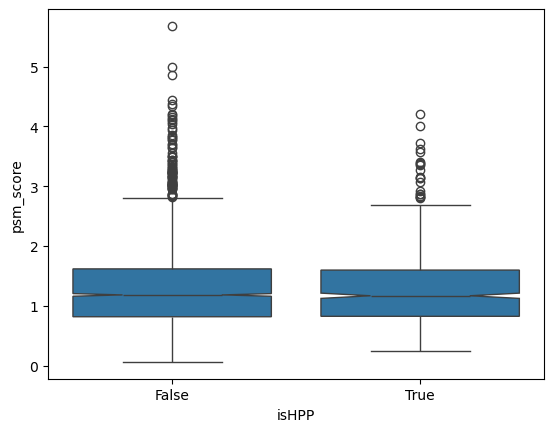

In [132]:
sns.boxplot(data=data,x="isHPP",y="psm_score", notch=True)

#### Annotate non-canonical proteins by localisation, biotype and MS score

In [133]:
#see "Ensemble biotype..." tab for code reference
def get_noncanonHPP_gene_biotype_loc_msscore(df,ENS,OPens):
    op_alt_biotype=[];op_alt_loc=[];op_alt_genename=[]
    OPnoncan_MSscore=[]    
    for protind,prot in enumerate(df["protein"].tolist()):
        print(protind,prot)
        try:
            OPnoncan_MSscore.append(OPens.loc[OPens["protein accession"]==prot,"MS score"].values[0])
        except IndexError:
            if True in set(list(OPens["protein accession (others)"].str.contains(prot).dropna())):
                OPnoncan_MSscore.append(OPens.loc[OPens["protein accession (others)"].str.contains(prot).dropna(),"MS score"].values[0])
            else:
                OPnoncan_MSscore.append(np.nan)
        #gene name, biotype, loc - here use OP with ensemble trx accessions
        try:
            trx=OPens.loc[OPens["protein accession numbers"]==prot,"transcript accession"].values[0]
            op_alt_biotype.append(ENS.loc[ENS["Transcript stable ID"]==trx[0:15],'Gene type'].values[0])
            op_alt_loc.append(OPens.loc[OPens["protein accession numbers"]==prot,"localization"].values[0])
            op_alt_genename.append(OPens.loc[OPens["protein accession numbers"]==prot,'gene symbol'].values[0])
        except:
            #print(prot)
            a=[]
            for i in OPens["protein accession (others)"]:
                if not isinstance(i,str):
                    a.append(False)
                else:
                    if prot in i:
                        a.append(True)
                    else:
                        a.append(False)
            if any(a):
                trx=OPens.loc[a,"transcript accession"].values[0]
                prots=OPens.loc[a,"protein accession (others)"].values[0]
                if trx[0:15] in ENS["Transcript stable ID"].values.tolist():
                    op_alt_biotype.append(ENS.loc[ENS["Transcript stable ID"]==trx[0:15],'Gene type'].values[0])
                    op_alt_loc.append(OPens.loc[OPens["protein accession (others)"]==prots,"localization"].values[0])
                    op_alt_genename.append(OPens.loc[OPens["protein accession (others)"]==prots,'gene symbol'].values[0])
                else:
                    for trx in OPens.loc[a,"transcript accession"].values:
                        if trx[0:15] in ENS["Transcript stable ID"].values.tolist():
                            op_alt_biotype.append(ENS.loc[ENS["Transcript stable ID"]==trx[0:15],'Gene type'].values[0])
                            op_alt_loc.append(OPens.loc[OPens["protein accession (others)"]==prots,"localization"].values[0])
                            op_alt_genename.append(OPens.loc[OPens["protein accession (others)"]==prots,'gene symbol'].values[0])
                            break
            else:
                op_alt_biotype.append(np.nan)
                op_alt_loc.append(np.nan)
                op_alt_genename.append(np.nan)
    return op_alt_genename,op_alt_biotype, op_alt_loc, OPnoncan_MSscore

In [136]:
#biotype Ens 106 , localisation
ENS106_file="./../mart106_export.txt"
#with gzip.open(f"{ENS106_file}.gz", 'rb') as f_in:
#    with open(ENS106_fil>e, 'wb') as f_out:
#        shutil.copyfileobj(f_in, f_out)
ENS106=pd.read_csv(ENS106_file,sep="\t")
ENS106.columns

Index(['Gene stable ID', 'Transcript stable ID', 'Gene description',
       'Gene name', 'Gene type', 'Transcript type'],
      dtype='object')

In [139]:
#work only with ensembl
OPens=OPtsv[OPtsv['transcript accession'].astype("str").apply(lambda x: "ENST" in x)]

In [140]:
ENS106[ENS106['Gene name']=="HSP90AA2P"]

,Gene stable ID,Transcript stable ID,Gene description,Gene name,Gene type,Transcript type
64480,ENSG00000224411,ENST00000530115,heat shock protein 90 alpha family class A mem...,HSP90AA2P,processed_pseudogene,processed_pseudogene


In [141]:
OPens[OPens['gene symbol']=="HSP90AA2P"]

,protein accession,protein accession (others),protein type,protein length (a.a.),molecular weight (kDa),isoelectric point,frame,gene symbol,chr,start genomic coordinates,...,type,localization,start transcript coordinates,stop transcript coordinates,MS score,TE Translation Event score,Orthology Across 10 Species #:Species Names,Kozak motif,High-efficiency TIS motif,trx_stab
2230062,Q14568,Q14568,RefProt,343,39.36,4.29,1,HSP90AA2P,11,27890001,...,misc_RNA,-,1,1033,43,0,-,-,16,ENST00000530115
2230063,IP_776629,IP_776629,AltProt,190,22.32,5.26,1,HSP90AA2P,11,27889353,...,misc_RNA,3'UTR,1108,1681,5,1,+,-,7,ENST00000530115
2230064,IP_776630,IP_776630,AltProt,42,4.88,8.52,2,HSP90AA2P,11,27889121,...,misc_RNA,3'UTR,1784,1913,0,0,-,-,2,ENST00000530115
2230065,IP_776631,IP_776631,AltProt,82,9.86,13.08,2,HSP90AA2P,11,27890087,...,misc_RNA,CDS,698,947,1,0,-,-,2,ENST00000530115
2230066,IP_776632,IP_776632,AltProt,166,18.60,4.25,3,HSP90AA2P,11,27888838,...,misc_RNA,3'UTR,1695,2196,10,0,-,-,7,ENST00000530115


In [142]:
#use OP 16 for MS score and OP 2 for gene annotation
op_alt_genename_HPP,op_alt_biotype_HPP, op_alt_loc_HPP, OPnoncan_MSscore_HPP=get_noncanonHPP_gene_biotype_loc_msscore(comb_datasets_nc_symmary,ENS106,OPens)

0 II_072818
1 II_105505
2 II_141289
3 II_164251
4 II_254386
5 II_272376
6 II_278328
7 II_3387987
8 II_3406570
9 II_3424718
10 II_3428044
11 II_3436423
12 II_3768748
13 II_3768748
14 II_3770850
15 II_3771306
16 II_3776381
17 II_3776861
18 II_3777942
19 II_3779000
20 II_3782838
21 II_3784955
22 II_3786968
23 II_3789193
24 II_3790919
25 II_3790919
26 II_3790919
27 II_3790919
28 II_3791831
29 II_3792713
30 II_3792715
31 II_3797019
32 II_3797019
33 II_3798112
34 II_3802806
35 II_3804258
36 II_4486433
37 II_4488111
38 II_4494432
39 II_4495219
40 II_560670
41 II_567153
42 II_567908
43 II_567908
44 II_570495
45 II_575207
46 II_575324
47 II_585158
48 II_586544
49 II_586544
50 II_590136
51 II_590136
52 II_590372
53 II_593931
54 II_596457
55 II_604645
56 II_608351
57 II_617395
58 II_617395
59 II_618665
60 II_624374
61 II_627137
62 II_629105
63 II_633634
64 II_641982
65 II_642046
66 II_644044
67 II_644212
68 II_644212
69 II_647919
70 II_659933
71 II_661259
72 II_661265
73 II_665625
74 II_669591
75

In [143]:
#add annotation

comb_datasets_nc_symmary["gene"]=op_alt_genename_HPP
comb_datasets_nc_symmary["biotype"]=op_alt_biotype_HPP
comb_datasets_nc_symmary["localization"]=op_alt_loc_HPP
comb_datasets_nc_symmary["MSscore"]=OPnoncan_MSscore_HPP

In [144]:
comb_datasets_nc_symmary.to_csv("3_noncanon_hpp_symmary_2.txt",sep="\t")

In [145]:
comb_datasets_nc_symmary.columns

Index(['protein', 'peptide', 'spectrum_titles', 'spectrum_files', 'datasets',
       'isHPP', 'gene', 'biotype', 'localization', 'MSscore'],
      dtype='object')

In [146]:
len(comb_datasets_nc_symmary.protein.unique())

691

In [147]:
len(comb_datasets_nc_symmary[comb_datasets_nc_symmary.isHPP].protein.unique())

74

In [256]:
#novel protein

comb_datasets_nc_symmary[(comb_datasets_nc_symmary.isHPP)&(comb_datasets_nc_symmary.MSscore==0)]

,protein,peptide,spectrum_titles,spectrum_files,datasets,isHPP,gene,biotype,localization,MSscore


In [149]:
#comb_datasets_nc_symmary[(comb_datasets_nc_symmary.protein.isin(["IP_672475","IP_636983"]))]

#### Comparison with existing evidence (MS score from OpenProt)

In [150]:
len(comb_datasets_nc_symmary.protein.unique())

691

In [204]:
len(comb_datasets_nc_symmary)

944

In [208]:
nc_all_msscore=pd.DataFrame(columns=["isHPP","score","prot_n"])
tmp=comb_datasets_nc_symmary.copy(deep=True)
print(len(tmp[tmp.isHPP].protein.unique()))
tmp.drop_duplicates(["protein"],keep="first",inplace=True)
print(len(tmp[tmp.isHPP]))
for score,group in tmp.groupby("MSscore"):
    nc_all_msscore.loc[len(nc_all_msscore)]=["all",score,len(group)]
    nc_all_msscore.loc[len(nc_all_msscore)]=["True",score,len(group[group.isHPP])]
#summarise    
nc_all_msscore_sum=pd.DataFrame()
for isHPP in ["all","True"]:
    group=nc_all_msscore[nc_all_msscore.isHPP==isHPP]
    #print(group.score.max())
    tmp=group.head(3)
    tmp.reset_index(drop=True,inplace=True)
    #print(tmp)
    tmp.loc[len(tmp)]=[isHPP,"3-10",group.loc[(group.score>2)&(group.score<=10),"prot_n"].sum()]
    tmp.loc[len(tmp)]=[isHPP,"11-100",group.loc[(group.score>10)&(group.score<=100),"prot_n"].sum()]
    tmp.loc[len(tmp)]=[isHPP,">100",group.loc[(group.score>100),"prot_n"].sum()]
    #print(tmp)
    nc_all_msscore_sum=pd.concat([nc_all_msscore_sum,tmp])

74
62


/tmp/ipykernel_1068162/3350833652.py:17: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_1068162/3350833652.py:18: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_1068162/3350833652.py:19: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_1068162/3350833652.py:17: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https:

In [209]:
nc_all_msscore_sum.groupby("isHPP").apply(lambda x: x["prot_n"].sum())

/tmp/ipykernel_1068162/4264323426.py:1: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



isHPP
True     62
all     691
dtype: int64

In [210]:
nc_all_msscore_sum[(nc_all_msscore_sum.isHPP=="all")&(nc_all_msscore_sum.score==0)].prot_n/nc_all_msscore_sum[(nc_all_msscore_sum.isHPP=="all")].prot_n.sum()

0    0.176556
Name: prot_n, dtype: float64

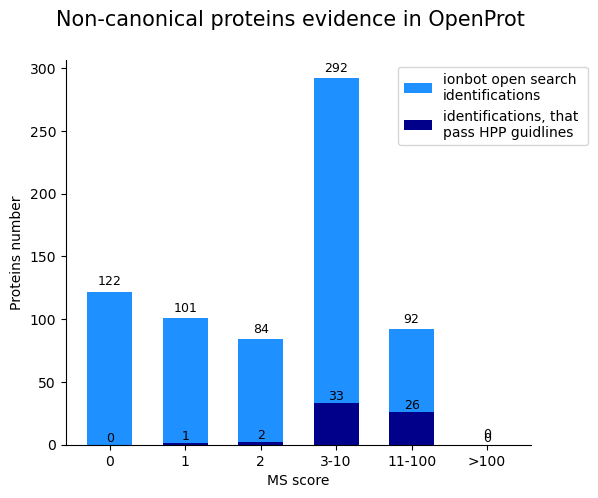

In [211]:
fig, ax = plt.subplots(1, figsize=(6, 5))
fig.suptitle('Non-canonical proteins evidence in OpenProt', fontsize=15)
colors = {"all": 'dodgerblue', "True": 'darkblue'}
labels = {"all": "ionbot open search \nidentifications","True": "identifications, that \npass HPP guidlines"}

for isHPP in ["all", "True"]:
    group = nc_all_msscore_sum.groupby("isHPP").get_group(isHPP)
    ax.bar(range(len(group)), group.prot_n, color=colors[isHPP], width=0.6, label=labels[isHPP])
    ax.set_xticks(range(len(group)))
    ax.set_xticklabels(group.score)
    ax.set_xlabel("MS score")
    ax.set_ylabel("Proteins number")

    # Add values on top of the bars
    for i, value in enumerate(group.prot_n):
        ax.text(i, value + max(group.prot_n)*0.01, str(value), ha='center', va='bottom', fontsize=9)

# Hide left and top spines
for i, spine in enumerate(ax.spines.values()):
    if i == 1 or i == 3:
        spine.set_visible(False)

# Optional: add legend
ax.legend(bbox_to_anchor=(0.7,1))

plt.savefig(f"{figsave_folder}F5A_open_ionbot_altmsscore_bar.svg",format="svg", bbox_inches = 'tight') #put vals on top

In [212]:
a=nc_all_msscore_sum[nc_all_msscore_sum.isHPP=="all"]
a[a.score.isin(["3-10","11-100",">100"])].prot_n.sum()/a[a.score!=0].prot_n.sum()

np.float64(0.6748681898066784)

#### Biotype and localization of non-canononical proteins, that pass HPP guidlines

In [213]:
#protein level

data_plot=comb_datasets_nc_symmary[comb_datasets_nc_symmary.isHPP]
data_plot.drop_duplicates("protein",inplace=True)

/tmp/ipykernel_1068162/3805601611.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [214]:
data_plot.localization.unique()

array(['-', "3'UTR"], dtype=object)

In [215]:
data_plot[data_plot.localization=="3'UTR"]

,protein,peptide,spectrum_titles,spectrum_files,datasets,isHPP,gene,biotype,localization,MSscore
0,IP_776629,MDNCEELIPEYLNFIRGVVDSEDLPLNISR,[130327_o2_04_hu_P2_2hr: controllerType=0 cont...,"[130327_o2_04_hu_P2_2hr.mgf, AM16.mgf]","[PXD002057.v0.11.4, PXD005833.v0.11.4]",True,HSP90AA2P,processed_pseudogene,3'UTR,5
0,IP_776632,DLLILLYETALLSSGFSLEDPQTHANR,[130327_o2_04_hu_P2_2hr: controllerType=0 cont...,[130327_o2_04_hu_P2_2hr.mgf],[PXD002057.v0.11.4],True,HSP90AA2P,processed_pseudogene,3'UTR,10


In [216]:
data_plot[data_plot.biotype=="protein_coding"]

,protein,peptide,spectrum_titles,spectrum_files,datasets,isHPP,gene,biotype,localization,MSscore


In [217]:
OPtsv[OPtsv['protein accession']=="IP_647512"]

,protein accession,protein accession (others),protein type,protein length (a.a.),molecular weight (kDa),isoelectric point,frame,gene symbol,chr,start genomic coordinates,...,type,localization,start transcript coordinates,stop transcript coordinates,MS score,TE Translation Event score,Orthology Across 10 Species #:Species Names,Kozak motif,High-efficiency TIS motif,trx_stab
1991143,IP_647512,IP_647512,AltProt,136,15.75,6.93,3,BAZ2B,2,159462414,...,misc_RNA,-,2337,2748,4,0,-,-,8,ENST00000483316


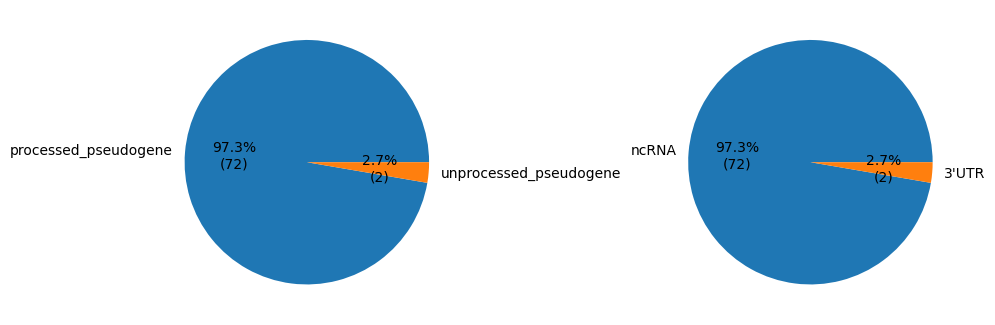

In [218]:
#biotype
a=data_plot.biotype.value_counts()
a["processed_pseudogene"]=a[["processed_pseudogene","transcribed_processed_pseudogene"]].sum()
a["unprocessed_pseudogene"]=a[["unprocessed_pseudogene","transcribed_unprocessed_pseudogene"]].sum()
a.drop(["transcribed_processed_pseudogene","transcribed_unprocessed_pseudogene"],inplace=True)
#localization
b=data_plot.localization.value_counts()
b.rename({"-":"ncRNA"},inplace=True)
def make_autopct(values):
    def my_autopct(pct):
        total = sum(values)
        val = int(round(pct * total / 100.0))
        return f'{pct:.1f}%\n({val})'
    return my_autopct

fig,ax = plt.subplots(1,2,figsize=(10,6))
ax[0].pie(a.values, labels=a.index, autopct=make_autopct(a.values));
ax[1].pie(b.values, labels=b.index, autopct=make_autopct(b.values));
#plt.title("Biotype Distribution", fontsize=14)
plt.tight_layout()
plt.savefig(f"{figsave_folder}F5C_open_ionbot_bioloc.svg",format="svg", bbox_inches = 'tight')

In [219]:
#1-(a["protein_coding"]/a.sum())

#### PSM, peptide and reproducability of non-canonical proteins, that pass HPP guidlines

/tmp/ipykernel_1068162/2363041512.py:7: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

/tmp/ipykernel_1068162/2363041512.py:10: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



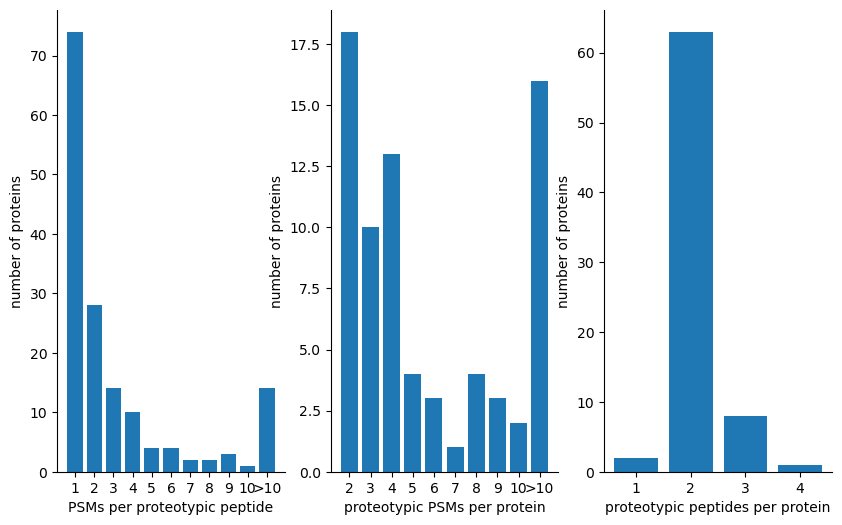

In [220]:
#number of psms per peptide and protein
data_plot=comb_datasets_nc_symmary[comb_datasets_nc_symmary.isHPP]
#psm per proteotypic pep
pep=Counter(data_plot.spectrum_titles.apply(lambda x: len(x)))
pep=dict(sorted(pep.items()))
#proteotypic PSMs per prot
prot=Counter(data_plot.groupby("protein").apply(lambda x: np.sum(x["spectrum_titles"].apply(lambda x: len(x)))))
prot=dict(sorted(prot.items()))
#proteotypic pep per prot
pep_prot=Counter(data_plot.groupby("protein").apply(lambda x: len(x["peptide"])))
pep_prot=dict(sorted(pep_prot.items()))

fig,ax = plt.subplots(1,3,figsize=(10,6))

clip=10
pep[f">{clip}"]=np.sum([v for k,v in pep.items() if k>clip])
[pep.pop(x, None) for x in [k for k in pep if isinstance(k,str) or k>clip][:-1]]

ax[0].bar(range(len(pep)),pep.values());
ax[0].set_xticks(range(len(pep)),pep.keys());
ax[0].set_xlabel("PSMs per proteotypic peptide");
ax[0].set_ylabel("number of proteins");

clip=10
prot[f">{clip}"]=np.sum([v for k,v in prot.items() if k>clip])
[prot.pop(x, None) for x in [k for k in prot if isinstance(k,str) or k>clip][:-1]]

ax[1].bar(range(len(prot)),prot.values());
ax[1].set_xticks(range(len(prot)),prot.keys());
ax[1].set_xlabel("proteotypic PSMs per protein");
ax[1].set_ylabel("number of proteins");

ax[2].bar(range(len(pep_prot)),pep_prot.values());
ax[2].set_xticks(range(len(pep_prot)),pep_prot.keys());
ax[2].set_xlabel("proteotypic peptides per protein");
ax[2].set_ylabel("number of proteins");

for axi in ax:
    for i, spine in enumerate(axi.spines.values()):
        if i == 1 or i == 3:
            spine.set_visible(False)


In [221]:
Counter(data_plot.spectrum_titles.apply(lambda x: len(x)))[1]/len(data_plot)

0.47435897435897434

In [222]:
from matplotlib.collections import EllipseCollection
#https://stackoverflow.com/questions/34556180/how-can-i-plot-a-correlation-matrix-as-a-set-of-ellipses-similar-to-the-r-open
from matplotlib.patches import Rectangle, Ellipse
from matplotlib.legend_handler import HandlerPatch
from matplotlib.cm import ScalarMappable
class HandlerEllipse(HandlerPatch):
    def create_artists(self, legend, orig_handle,
                       xdescent, ydescent, width, height, fontsize, trans):
        center = (width / 2 - xdescent, height / 2 - ydescent)
        p = Ellipse(center, orig_handle.width, orig_handle.height)
        p.set_transform(trans)
        p.set_facecolor(orig_handle.get_facecolor())
        p.set_edgecolor(orig_handle.get_edgecolor())
        p.set_alpha(orig_handle.get_alpha())
        return [p]
def plot_corr_ellipses(data, data_msms, data_new, ax=None, **kwargs):

    M = np.array(data)
    M_msms = np.array(data_msms)
    M_new = np.array(data_new).ravel()

    if not M.ndim == 2:
        raise ValueError('data must be a 2D array')
    if ax is None:
        fig, ax = plt.subplots(1, 1, subplot_kw={'aspect':'equal'}, figsize=(18, 12))
        ax.set_xlim(-0.5, M.shape[1] + 3)  # Increase xlim to fit the new column
        ax.set_ylim(-0.5, M.shape[0] - 0.5)

    # xy locations of each ellipse center
    xy = np.indices(M.shape)[::-1].reshape(2, -1).T
    
    # Set the size and angle for ellipses
    h = np.abs(M).ravel() * 0.3
    a = np.sign(M).ravel()
    #print(a,h,xy)
    if isinstance(a, (int, float)):
        a = np.full_like(h, a, dtype=float)  # Match the shape of h
    else:
        a = np.array(a, dtype=float)
    c = M_msms.ravel()

    norm = plt.Normalize(min(c), max(c))
    colormap = plt.cm.rainbow
    colors = colormap(norm(c))

    # Plot ellipses
    ec = EllipseCollection(
        widths=h, heights=h, angles=a, units='x', offsets=xy,
        transOffset=ax.transData, #array=M.ravel(),
        facecolors=colors, edgecolors="black", linewidths=0.5, **kwargs
    )
    ax.add_collection(ec)

    sm = ScalarMappable(norm=norm, cmap=colormap)
    sm.set_array([])  # Needed to set up the colorbar
    
    # Adjust the size and position of the colorbar
    cbar = plt.colorbar(sm, ax=ax, fraction=0.01, pad=-0.1)  # Adjust fraction and pad for size/position
    cbar.set_label('PSMs number', fontsize=8)
    cbar.ax.tick_params(labelsize=8)  # Adjust font size for ticks

    # Add legend for ellipse sizes
    legend_sizes = [10, 20, 30]
    legend_labels = [int(s/10) for s in legend_sizes]

    legend_patches = [
        Ellipse((0, 0), width=s, height=s, edgecolor='black', facecolor="white", alpha=1)
        for s in legend_sizes
    ]

    legend = ax.legend(
        legend_patches, legend_labels, 
        loc='upper right', title="peptides number",
         handler_map={Ellipse: HandlerEllipse()},
        handlelength=2, fontsize=8, frameon=False, bbox_to_anchor=(0.95,1)
    )

    ax.add_artist(legend)

    #---
    #  Plot the new column as colored rectangles
    norm_new = plt.Normalize(min(M_new), max(M_new))
    cmap_new = plt.cm.coolwarm  # Example colormap for the new column

    for i, value in enumerate(M_new):
        color = cmap_new(norm_new(value)) #orm_new(value)
        rect = Rectangle(
            (M.shape[1] - 1.5, i - 1),  # Position next to the last column
            1, 1,
            facecolor=color,
            edgecolor="black"
        )
        #ax.add_patch(rect)
    #---
    
    #  Add tick labels if data is a DataFrame
    if isinstance(data, pd.DataFrame):
        ax.set_xticks(np.arange(M.shape[1] + 1))
        ax.set_xticklabels(list(data.columns) + [''], rotation=90,fontsize=6)
        ax.set_yticks(np.arange(M.shape[0]))
        ax.set_yticklabels(data.index,fontsize=6)       
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

    return fig#ec

/tmp/ipykernel_1068162/1306819153.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



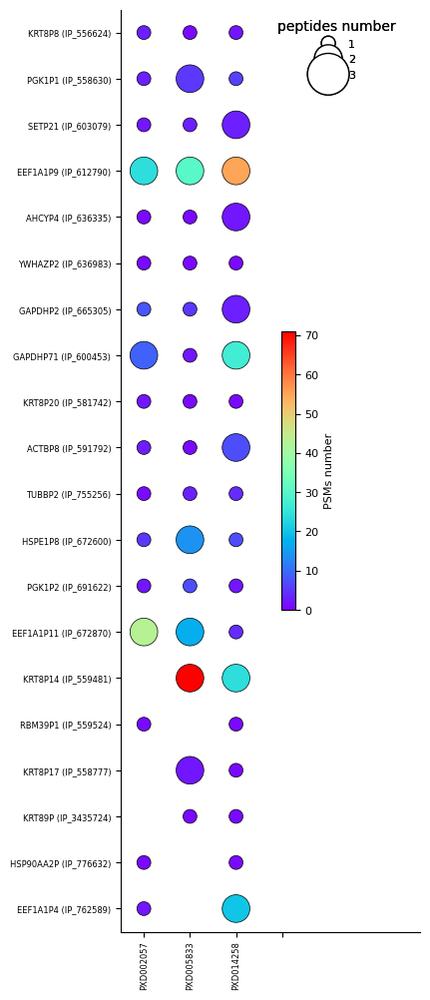

In [223]:
#pep
dat_nc_pep=pd.DataFrame(index=data_plot.protein.unique(),columns=["PXD002057","PXD005833","PXD014258"])
for protein, group in data_plot.groupby("protein"):
    #print(len(group))
    dat_count=[np.sum([1 if col+".v0.11.4" in l else 0 for l in group.datasets.tolist() ]) for col in dat_nc_pep.columns]
    #print(dat_count)
    dat_nc_pep.loc[protein]=dat_count
    
#msms
dat_nc_msms=pd.DataFrame(index=data_plot.protein.unique(),columns=["PXD002057","PXD005833","PXD014258"])
for protein, group in data_plot.groupby("protein"):
    dat_count=Counter([e for l in group.datasets.tolist() for e in l])
    dat_nc_msms.loc[protein]=[dat_count[col+".v0.11.4"] if col+".v0.11.4" in dat_count else 0 for col in dat_nc_msms.columns]


#order by sum of peptides
dat_nc_msms = dat_nc_msms.apply(pd.to_numeric, errors='coerce')
dat_nc_msms["sum"] = dat_nc_msms.astype(bool).sum(axis=1)
#print(datasets_nc_peptides.head(10))
dat_nc_msms.sort_values("sum",inplace=True, ascending=False)
dat_nc_pep=dat_nc_pep.reindex(dat_nc_msms.index.tolist())
dat_nc_msms.drop("sum",axis=1,inplace=True)
datasets_nc_biotype=data_plot[["protein","biotype"]]
datasets_nc_biotype.drop_duplicates(inplace=True)
datasets_nc_biotype.set_index("protein",drop=True,inplace=True)
datasets_nc_biotype=datasets_nc_biotype.reindex(dat_nc_msms.index.tolist())
datasets_nc_biotype.replace("protein_coding",1,inplace=True) #novel isoform in 3/4 cases
datasets_nc_biotype.replace("processed_pseudogene",0,inplace=True)
datasets_nc_biotype.replace("transcribed_processed_pseudogene",0,inplace=True)
datasets_nc_biotype.replace("transcribed_unprocessed_pseudogene",0,inplace=True)
datasets_nc_biotype.replace("unprocessed_pseudogene",0,inplace=True)
#rename axis
dat_nc_pep.index=[f'{data_plot.loc[data_plot.protein==protein,"gene"].iloc[0]} ({protein})' for protein in dat_nc_pep.index.tolist()]
#top
n=20
fig=plot_corr_ellipses(dat_nc_pep.head(n)[::-1],dat_nc_msms.head(n)[::-1],datasets_nc_biotype.head(n)[::-1])#[::-1]
#all in ranges
#def generate_ranges(start, end, step):
#    return [[i, i + step - 1] for i in range(start, end + 1, step)]
#for st,end in generate_ranges(0,len(dat_nc_pep)-1,20):
#    print(st,end)
#    if end>len(dat_nc_pep)-1: end=len(dat_nc_pep)-1
#    plot_corr_ellipses(dat_nc_pep.iloc[range(st,end)],dat_nc_msms.iloc[range(st,end)],datasets_nc_biotype.iloc[range(st,end)])#[::-1]

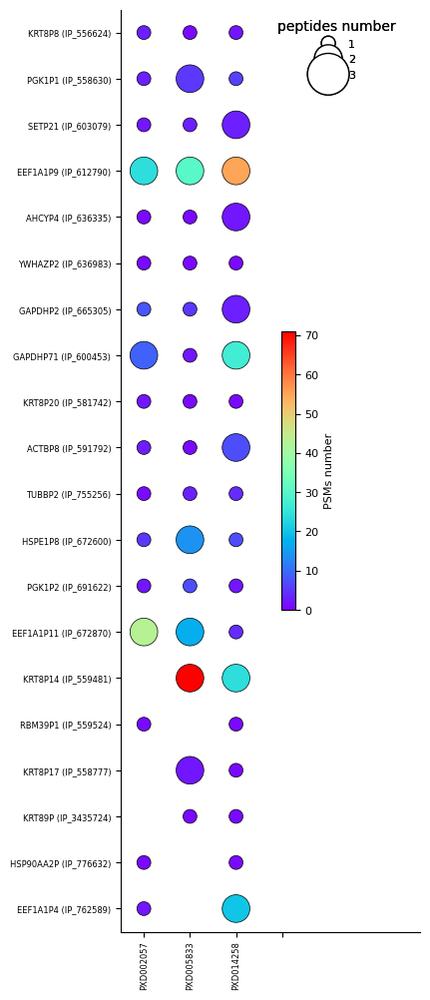

In [224]:
n=20
fig=plot_corr_ellipses(dat_nc_pep.head(n)[::-1],dat_nc_msms.head(n)[::-1],datasets_nc_biotype.head(n)[::-1])
fig.savefig(f"{figsave_folder}S_top_hpppass_aboundance.svg",format="svg", bbox_inches = 'tight')


In [225]:
dat_nc_msms.index=[f'{data_plot.loc[data_plot.protein==protein,"gene"].iloc[0]} ({protein})' for protein in dat_nc_msms.index.tolist()]

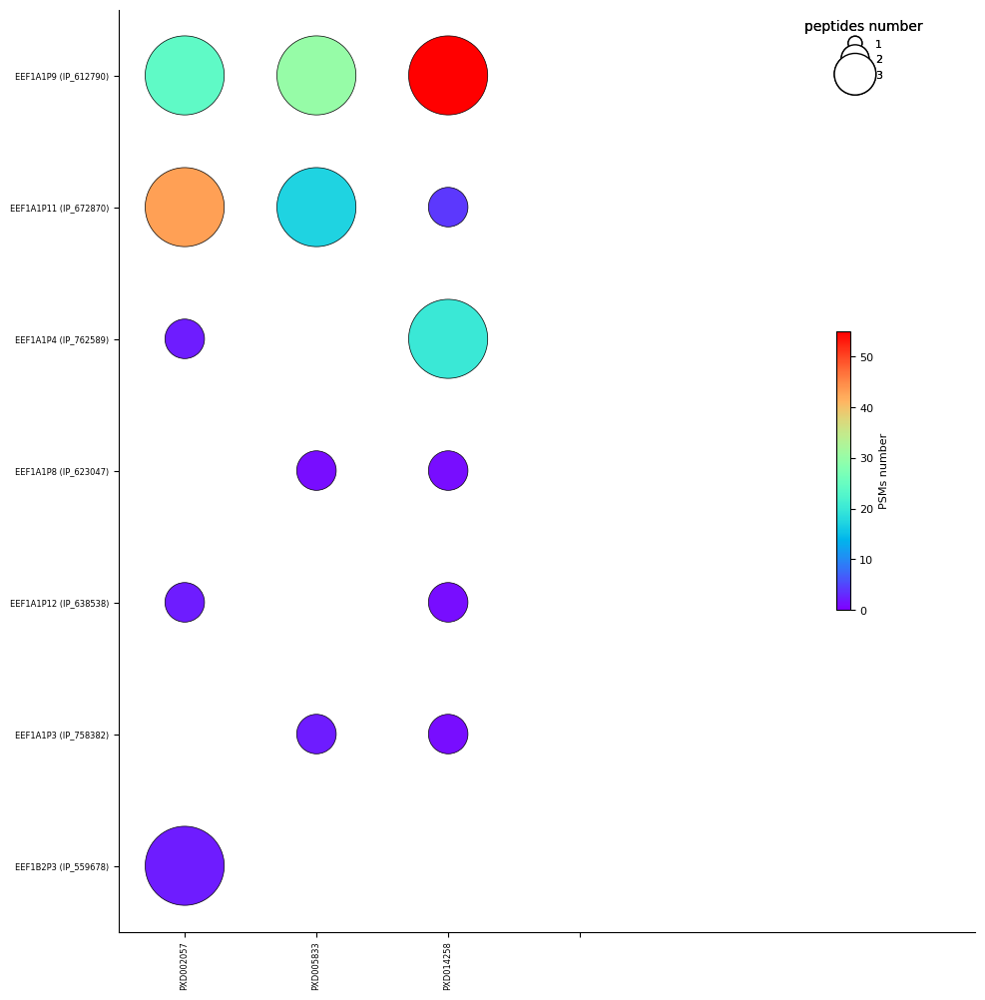

In [226]:
fig=plot_corr_ellipses(dat_nc_pep[dat_nc_msms.index.str.contains("EEF1")][::-1],dat_nc_msms[dat_nc_msms.index.str.contains("EEF1")][::-1],datasets_nc_biotype[dat_nc_msms.index.str.contains("EEF1")][::-1])
fig.savefig(f"{figsave_folder}S_EEF1_hpppass_aboundance.svg",format="svg", bbox_inches = 'tight')

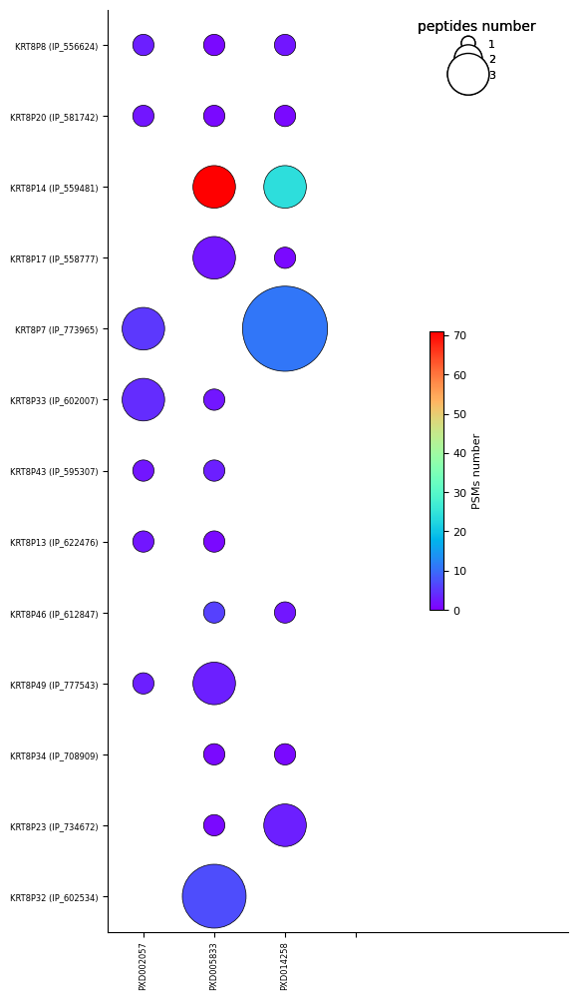

In [227]:
protein_sufx="KRT8P"
fig=plot_corr_ellipses(dat_nc_pep[dat_nc_msms.index.str.contains(protein_sufx)][::-1],dat_nc_msms[dat_nc_msms.index.str.contains(protein_sufx)][::-1],datasets_nc_biotype[dat_nc_msms.index.str.contains(protein_sufx)][::-1])
fig.savefig(f"{figsave_folder}S_{protein_sufx}_hpppass_aboundance.svg",format="svg", bbox_inches = 'tight')

0 21
22 43
44 65
66 87


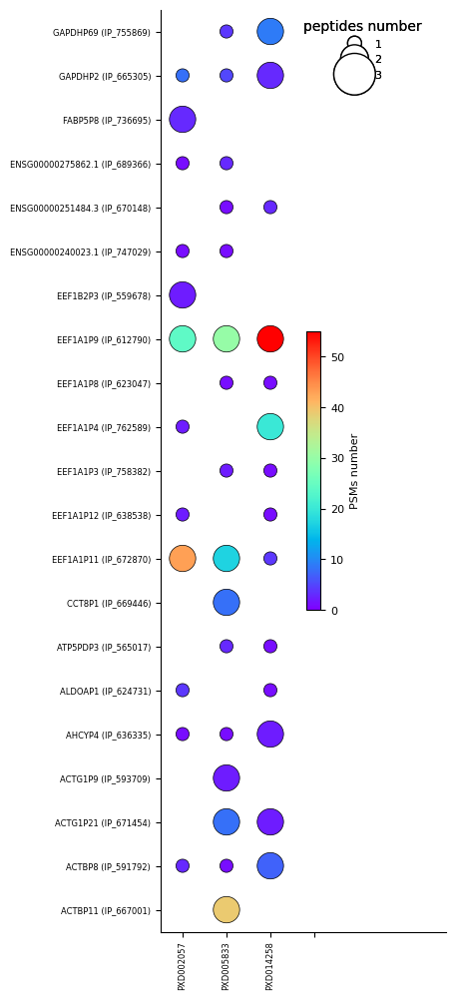

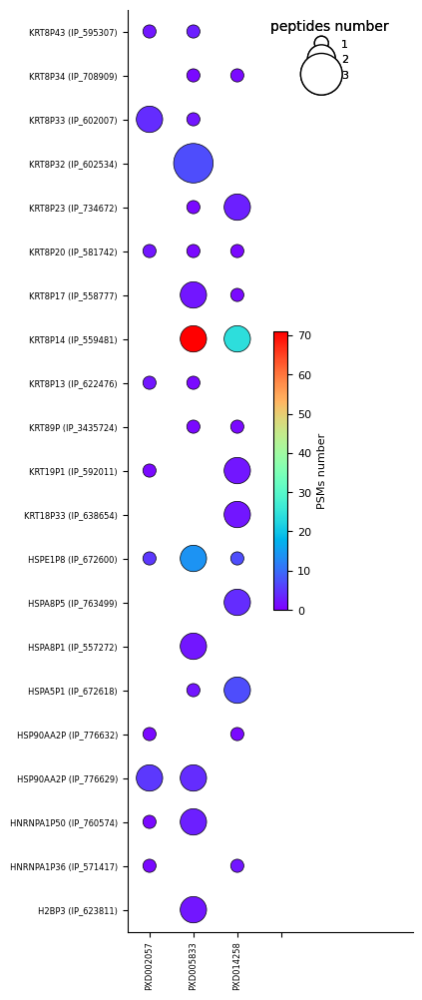

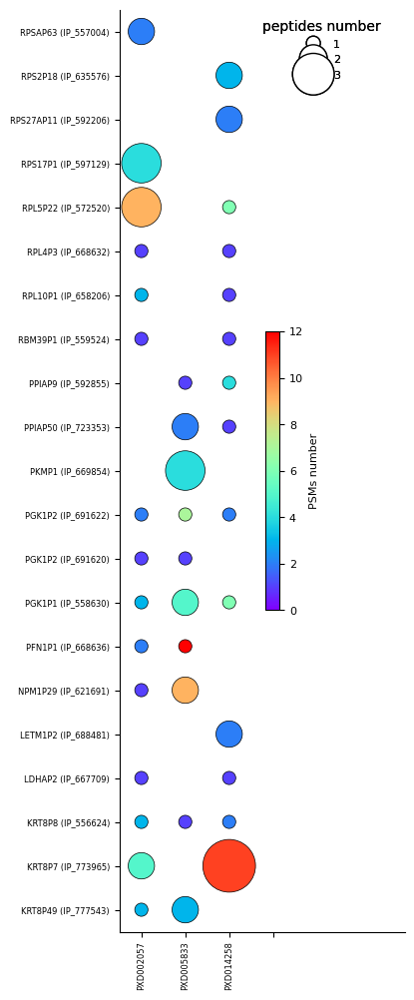

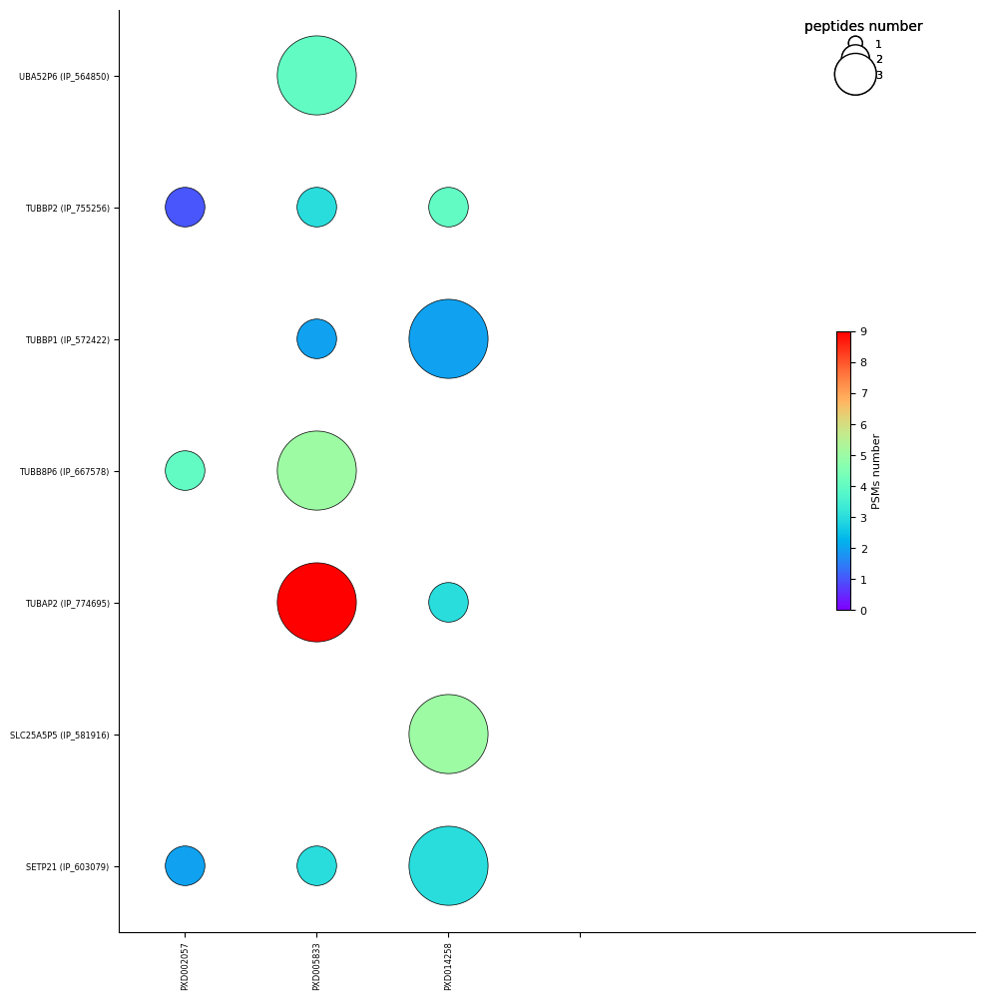

In [228]:
#all in ranges
def generate_ranges(start, end, step):
    return [[i, i + step - 1] for i in range(start, end + 1, step)]
data=dat_nc_pep.copy(deep=True)
data=data.sort_index()
data1=dat_nc_msms.copy(deep=True)
data1=data1.sort_index()
pdf = matplotlib.backends.backend_pdf.PdfPages(f"{figsave_folder}nc_HPPpass_aboundance.pdf")
for st,end in generate_ranges(0,len(data)-1,22):
    print(st,end)
    if end>len(data)-1: end=len(data)-1
    fig=plot_corr_ellipses(data.iloc[range(st,end)],data1.iloc[range(st,end)],datasets_nc_biotype.iloc[range(st,end)])#[::-1]
    pdf.savefig(fig)
pdf.close()

In [229]:
from scipy.spatial import distance

In [230]:
#check non-canonical keratine detected peptides against keratine
keratin_peps=all_peptide_sequences['op|P05787|TX=9606']
kerps_name=[s.split(" (")[1].strip(")") for s in dat_nc_pep.index if "KRT8" in s]
data=comb_datasets_nc_symmary[comb_datasets_nc_symmary.protein.isin(kerps_name)]
data["parental_diff_1"]=False
data["parental_diff_pep"]=False
for i, row in data.iterrows():
    pep=row.peptide
    pep_dist=[]
    for k_pep in keratin_peps:
        if len(pep)==len(k_pep):
            pep_dist.append(len([1 for a,b in zip(pep,k_pep) if a!=b])==1 )
        else:
            pep_dist.append(False)
    if any(pep_dist):
        #print(len(keratin_peps),len(pep_dist),pep_dist.count(True),pep)
        data.loc[data.peptide==pep,"parental_diff_1"]=True
        data.loc[data.peptide==pep,"parental_diff_pep"]="|".join([pep for pep,b in zip(keratin_peps,pep_dist) if b])
            

/tmp/ipykernel_1068162/2836041224.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_1068162/2836041224.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [231]:
data.parental_diff_1.value_counts()

parental_diff_1
True     22
False    16
Name: count, dtype: int64

In [232]:
data.groupby("protein")["parental_diff_1"].all()

protein
IP_3435724    False
IP_556624     False
IP_558777     False
IP_559481      True
IP_581742     False
IP_595307     False
IP_602007      True
IP_602534     False
IP_612847     False
IP_622476     False
IP_708909      True
IP_734672      True
IP_773965     False
IP_777543      True
Name: parental_diff_1, dtype: bool

##### Mass difference

In [233]:
#mark manyaly spectra which pass manual curration
spectrum_title_pass = [
    "130327_o2_04_hu_P2_2hr: controllerType=0 controllerNumber=1 scan=16376",
    "130327_o2_04_hu_P2_2hr: controllerType=0 controllerNumber=1 scan=18666",
    "130327_o2_04_hu_P2_2hr: controllerType=0 controllerNumber=1 scan=13997",
    "130327_o2_06_hu_P3_2hr: controllerType=0 controllerNumber=1 scan=28010",
    "AM19:controllerType=0 controllerNumber=1 scan=27798",
    "AM19:controllerType=0 controllerNumber=1 scan=21612",
    "AM19:controllerType=0 controllerNumber=1 scan=24738",
    "AM16:controllerType=0 controllerNumber=1 scan=25091",
    "AM16:controllerType=0 controllerNumber=1 scan=24032",
    "AM17:controllerType=0 controllerNumber=1 scan=23464",
    "AM17:controllerType=0 controllerNumber=1 scan=15391",
    "AM17:controllerType=0 controllerNumber=1 scan=15979",
    "AM14:controllerType=0 controllerNumber=1 scan=17664",
    "ESC-HF-Sample-MCF4:controllerType=0 controllerNumber=1 scan=4028",
    "ESC-HF-Sample-BT474_2:controllerType=0 controllerNumber=1 scan=4212"
]
comb_datasets_ncun_filt["manual_spectra_check_pass"]=comb_datasets_ncun_filt.spectrum_title.apply(lambda x: x in spectrum_title_pass)
len(comb_datasets_ncun_filt[comb_datasets_ncun_filt["manual_spectra_check_pass"]]) #has to be 15

2

In [234]:
data=comb_datasets[comb_datasets.database_peptide.isin(comb_datasets_ncun_filt.database_peptide.tolist())]
data=data.merge(comb_datasets_ncun_filt[["database_peptide","passHPP"]],on="database_peptide", how="inner")
data["manual_spectra_check_pass"]=data.spectrum_title.apply(lambda x: x in spectrum_title_pass)
len(data[data["manual_spectra_check_pass"]]) #has to be 15
#mark EEF1 and KRT pseudogenes
data=data.merge(comb_datasets_nc_symmary[["peptide","gene"]], left_on="database_peptide",right_on="peptide",how="inner")
data["EEF1_member"]=data.gene.apply(lambda x: "EEF1" in x)
data["KRT_member"]=data.gene.apply(lambda x: "KRT" in x)
#check mass accuracy
data["precursor_peptide_mass"]=data.precursor_mass-data.peptide_mass
# Calculate ppm mass error
data["mass_error_ppm"] = ((data["precursor_mass"] - data["peptide_mass"]) / data["peptide_mass"]) * 1e6

In [235]:
#how many gene family members fall in +-50Da difference?
print("KRT",len(data[(data.KRT_member)&(abs(data.precursor_peptide_mass)<=50)])/len(data[data.KRT_member]))
print("EEF1",len(data[(data.EEF1_member)&(abs(data.precursor_peptide_mass)<=50)])/len(data[data.EEF1_member]))

KRT 0.7685185185185185
EEF1 0.9463414634146341


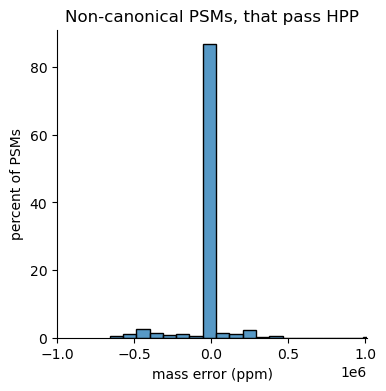

In [236]:
fig, ax = plt.subplots(figsize=(4,4))
sns.histplot(ax=ax,data=data[data.passHPP], x="mass_error_ppm",stat="percent", bins=20);
sns.despine();
ax.set_xlim(-1* 1e6,1.01* 1e6)
ax.set_xlabel("mass error (ppm)");
ax.set_ylabel("percent of PSMs");
ax.set_title("Non-canonical PSMs, that pass HPP")
plt.savefig(f"{figsave_folder}S_nc_passhpp_ppm.svg",format='svg', bbox_inches = 'tight')

### observed and DeepLC-predicted retention times

In [237]:
filename_suf="combined-features.csv"
openprot_features=pd.DataFrame()
for dataset_name in combined_first_datasets:
    database="openprot"
    path = os.path.join("./../fromUGhent_v0114_3",dataset_name,f"{dataset_name}-{database}",f"{dataset_name}-{database}-{filename_suf}")
    df=pd.read_csv(path)
    df["dataset_name"]=dataset_name
    openprot_features=pd.concat([openprot_features,df])

In [238]:
len(openprot_features)

700138

In [239]:
#select HPP pass spectra
openprot_features_hpp=openprot_features.merge(data[["spectrum_title","passHPP","observed_retention_time","manual_spectra_check_pass"]],on="spectrum_title", how="inner")

In [240]:
len(openprot_features_hpp)

766

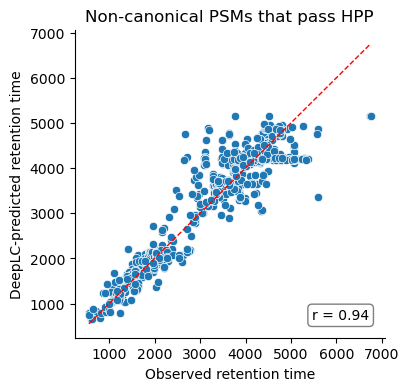

In [241]:
# Get the range of x and y for a proper diagonal
min_val = min(openprot_features_hpp["observed_retention_time"].min(),
              openprot_features_hpp["predicted_retention_time"].min())
max_val = max(openprot_features_hpp["observed_retention_time"].max(),
              openprot_features_hpp["predicted_retention_time"].max())

# Create figure and plot
fig, ax = plt.subplots(figsize=(4, 4))

# Scatter plot
sns.scatterplot(ax=ax, data=openprot_features_hpp, 
                x="observed_retention_time", 
                y="predicted_retention_time")

# Plot diagonal line (y = x)
ax.plot([min_val, max_val], [min_val, max_val], color='red', linestyle='--', linewidth=1)

res=stats.pearsonr(openprot_features_hpp.observed_retention_time,openprot_features_hpp.predicted_retention_time)
# Format the correlation value (e.g., r = 0.95, p = 0.0001)
textstr = f"r = {res.statistic:.2f}"

# Add text in lower-right corner of the axes
ax.text(0.95, 0.05, textstr,
        transform=ax.transAxes,
        fontsize=10,
        verticalalignment='bottom',
        horizontalalignment='right',
        bbox=dict(facecolor='white', edgecolor='gray', boxstyle='round,pad=0.3'))

# Style
sns.despine()
ax.set_xlabel("Observed retention time")
ax.set_ylabel("DeepLC-predicted retention time")
ax.set_title("Non-canonical PSMs that pass HPP")

# Save
plt.savefig(f"{figsave_folder}S_nc_passhpp_rettimeerror.svg", format='svg', bbox_inches='tight')

### HPP filtering outcome

In [335]:
#selected for manual evaluation
hpp_countdown["psm"]["manual_sel"]=hpp_countdown["pep"]["2pep2_saav"]
hpp_countdown["pep"]["manual_sel"]=hpp_countdown["pep"]["2pep2_saav"]
hpp_countdown["prot"]["manual_sel"]=hpp_countdown["prot"]["2pep2_saav"]
#from ionbot_open_noncanon_psm_hpp_pass.xlsx
hpp_countdown["psm"]["manualspec"]=10
hpp_countdown["pep"]["manualspec"]=10
hpp_countdown["prot"]["manualspec"]=10
#because all resulting spectra have 1 peptide per protein - final is 0
hpp_countdown["psm"]["final"]=0
hpp_countdown["pep"]["final"]=0
hpp_countdown["prot"]["final"]=0

In [336]:
hpp_countdown_df = pd.DataFrame(hpp_countdown)
hpp_countdown_df.index.name = 'step'
#put manual_sel before spec
row = hpp_countdown_df.loc[['manual_sel']]  # select as DataFrame (with double brackets)
hpp_countdown_df = hpp_countdown_df.drop('manual_sel')

# Insert it at position 1
hpp_countdown_df = pd.concat([hpp_countdown_df.iloc[:6], row, hpp_countdown_df.iloc[6:]])

#saav upp
row = hpp_countdown_df.loc[['2pep2_saav']]  # select as DataFrame (with double brackets)
hpp_countdown_df = hpp_countdown_df.drop('2pep2_saav')

# Insert it at position 1
hpp_countdown_df = pd.concat([hpp_countdown_df.iloc[:6], row, hpp_countdown_df.iloc[6:]])

In [337]:
hpp_countdown_df

,psm,pep,prot
step,,,
original,4003,944,691
<9aa,3855,900,657
nested,2696,758,657
<18aa,879,185,85
proteomapper,769,178,84
2pep1,766,175,81
2pep2_saav,738,167,77
manual_sel,167,167,77
manualspec,10,10,10


In [339]:
(10/697)*100

1.4347202295552368

In [246]:
import plotly.graph_objects as go

In [341]:
def sankey_stepwise(df, column_name,figsave_folder,wildcard):
    steps = df.index.tolist()
    source_steps = steps[:-1]
    target_steps = steps[1:]
    
    source_labels = [f'{column_name.upper()}:{s}' for s in source_steps]
    target_labels = [f'{column_name.upper()}:{s}' for s in target_steps]
    
    all_labels = list(pd.unique(source_labels + target_labels))
    label_map = {l: i for i, l in enumerate(all_labels)}
    
    values = [df.loc[target, column_name] for target in target_steps]

    fig = go.Figure(data=[go.Sankey(
        node=dict(
            pad=15,
            thickness=20,
            line=dict(color="black", width=0.5),
            label=all_labels,
        ),
        link=dict(
            source=[label_map[s] for s in source_labels],
            target=[label_map[t] for t in target_labels],
            value=values
        )
    )])

    fig.update_layout(title_text=f"Filtering in {column_name.upper()} steps", font_size=10)
    fig.write_image(f"{figsave_folder}S_{wildcard}_hpp_countdown_{column_name}.svg")
    fig.show()

In [342]:
# Sankey 3: Stepwise filtering in PSM
sankey_stepwise(hpp_countdown_df, 'psm',figsave_folder,"hpp")

In [343]:
sankey_stepwise(hpp_countdown_df, 'pep',figsave_folder,"hpp")

In [344]:
hpp_countdown_df["pep"].original-hpp_countdown_df["pep"]["2pep1"]

np.int64(769)

In [345]:
hpp_countdown_df

,psm,pep,prot
step,,,
original,4003,944,691
<9aa,3855,900,657
nested,2696,758,657
<18aa,879,185,85
proteomapper,769,178,84
2pep1,766,175,81
2pep2_saav,738,167,77
manual_sel,167,167,77
manualspec,10,10,10


In [346]:
(hpp_countdown_df["pep"]["<18aa"]-hpp_countdown_df["pep"]["proteomapper"])/(hpp_countdown_df["pep"].original-hpp_countdown_df["pep"]["2pep2_saav"])

np.float64(0.009009009009009009)

In [347]:
(hpp_countdown_df["pep"]["2pep1"]-hpp_countdown_df["pep"]["2pep2_saav"])/(hpp_countdown_df["pep"].original-hpp_countdown_df["pep"]["2pep2_saav"])

np.float64(0.010296010296010296)

In [348]:
hpp_countdown_df["prot"]/697

step
original        0.991392
<9aa            0.942611
nested          0.942611
<18aa           0.121951
proteomapper    0.120516
2pep1           0.116212
2pep2_saav      0.110473
manual_sel      0.110473
manualspec      0.014347
final           0.000000
Name: prot, dtype: float64

In [349]:
sankey_stepwise(hpp_countdown_df, 'prot',figsave_folder,"hpp")

In [350]:
#the list from global filtering, see how many left with hybrid
manual_protlist=[
    "IP_737172",
    "IP_773965",
    "IP_602007",
    "IP_689366",
    "IP_559481",
    "IP_762232",
    "IP_559481",
    "IP_669446",
    "IP_558630",
    "IP_691622",
    "IP_556624",
    "IP_564850",
    "IP_790880",
    "IP_589392",
    "IP_755869"
]
#OPtsv[OPtsv["protein accession"].isin(manual_protlist)]
comb_datasets_nc_symmary[(comb_datasets_nc_symmary.protein.isin(manual_protlist))&(comb_datasets_nc_symmary.isHPP)].drop_duplicates("protein")

,protein,peptide,spectrum_titles,spectrum_files,datasets,isHPP,gene,biotype,localization,MSscore
2,IP_556624,DVDEADMNKVELESR,[130327_o2_02_hu_P1_2hr: controllerType=0 cont...,"[130327_o2_02_hu_P1_2hr.mgf, 130327_o2_04_hu_P...","[PXD002057.v0.11.4, PXD002057.v0.11.4, PXD0020...",True,KRT8P8,processed_pseudogene,-,15
0,IP_558630,VLNNMETGTSLFDEEGAK,[AM15:controllerType=0 controllerNumber=1 scan...,[AM15.mgf],[PXD005833.v0.11.4],True,PGK1P1,processed_pseudogene,-,6
0,IP_559481,LEGLTDQINFLR,[AM12:controllerType=0 controllerNumber=1 scan...,"[AM12.mgf, AM12.mgf, AM16.mgf, AM20.mgf, AM11....","[PXD005833.v0.11.4, PXD005833.v0.11.4, PXD0058...",True,KRT8P14,processed_pseudogene,-,7
0,IP_564850,TITLEVEPSDTIENVSAK,[AM16:controllerType=0 controllerNumber=1 scan...,"[AM16.mgf, AM7.mgf, AM17.mgf]","[PXD005833.v0.11.4, PXD005833.v0.11.4, PXD0058...",True,UBA52P6,transcribed_processed_pseudogene,-,9
0,IP_602007,QLYEEEIRELQSWISDTSVVLSMDNSR,[130327_o2_02_hu_P1_2hr: controllerType=0 cont...,"[130327_o2_02_hu_P1_2hr.mgf, 130327_o2_06_hu_P...","[PXD002057.v0.11.4, PXD002057.v0.11.4]",True,KRT8P33,processed_pseudogene,-,13
0,IP_669446,DVDEVSSLLR,[AM16:controllerType=0 controllerNumber=1 scan...,"[AM16.mgf, AM20.mgf, AM7.mgf, AM18.mgf, AM17.m...","[PXD005833.v0.11.4, PXD005833.v0.11.4, PXD0058...",True,CCT8P1,processed_pseudogene,-,8
0,IP_689366,NLPFNFTWK,[AM7:controllerType=0 controllerNumber=1 scan=...,"[AM7.mgf, AM21.mgf, AM13.mgf]","[PXD005833.v0.11.4, PXD005833.v0.11.4, PXD0058...",True,ENSG00000275862.1,processed_pseudogene,-,2
0,IP_691622,TGQATVASGIPAGWLGLDCGPESSKK,[130327_o2_01_hu_C1_2hr: controllerType=0 cont...,"[130327_o2_01_hu_C1_2hr.mgf, 130327_o2_05_hu_C...","[PXD002057.v0.11.4, PXD002057.v0.11.4]",True,PGK1P2,processed_pseudogene,-,12
0,IP_755869,LVITGNLITIFQERDPSK,[AM16:controllerType=0 controllerNumber=1 scan...,"[AM16.mgf, AM16.mgf, AM7.mgf, AM17.mgf, ESC-HF...","[PXD005833.v0.11.4, PXD005833.v0.11.4, PXD0058...",True,GAPDHP69,processed_pseudogene,-,35
0,IP_773965,MDSIIAEVK,[ESC-HF-SampleHela2:controllerType=0 controlle...,"[ESC-HF-SampleHela2.mgf, ESC-HF-SampleHela2.mg...","[PXD014258.v0.11.4, PXD014258.v0.11.4, PXD0142...",True,KRT8P7,processed_pseudogene,-,14
